# Import of packages

The analysis pipeline uses 'autoprot' developed in our lab (https://doi.org/10.1101/2024.01.18.571429)

Autoprot is implemented in Python ≥ 3.9 and can be downloaded from https://github.com/ag-warscheid/autoprot. Online documentation is available at https://ag-warscheid.github.io/autoprot/.

In [1]:
import os
import urllib
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pylab as plt
import numpy as np
import itertools

import plotly.graph_objects as go
import plotly.express as px

import missingno as msn
import logomaker

from autoprot_dev import preprocessing as pp
from autoprot_dev import analysis as ana
from autoprot_dev import visualization as vis

from subprocess import run, PIPE

import warnings
warnings.filterwarnings('ignore')

cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9)

%matplotlib inline

import datetime

date = datetime.date.today().strftime('%Y%m%d')
dirname = os.getcwd()
rootdir = dirname

#important that font get exportet properly
# plt.rcParams['svg.fonttype'] = 'none'
# plt.rcParams['pdf.use14corefonts'] = True
plt.rcParams['pdf.fonttype'] = 42



COLORS = [ "cyan", "#dede00", "#377eb8", "#ffff00", "#e68a00", "#99ccff", 
          "#00ffcc", "#ff99ff", "#00b386","pink", "magenta"]


HUE_ORDER = ['Mitochondria','Acidocalcisome','ER', 'Cytoplasm','Nucleus','Nuclear Pore',
             'Cytoskeleton','Plasma membrane','Golgi', 'Glycosomal matrix', 'Glycosomal membrane']

Checking R installation...
Loading required package: rrcovNA
Loading required package: rrcov
Loading required package: robustbase
Scalable Robust Estimators with High Breakdown Point (version 1.7-2)
Scalable Robust Estimators with High Breakdown Point for
Incomplete Data (version 0.4-15)
Loading required package: tidyverse
── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.0     ✔ purrr   1.0.1
✔ tibble  3.1.8     ✔ dplyr   1.1.0
✔ tidyr   1.3.0     ✔ stringr 1.5.0
✔ readr   2.1.3     ✔ forcats 1.0.0
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Loading required package: BiocManager
Bioconductor version '3.16' is out-of-date; the current release version '3.20'
is available with R version '4.4'; see https://bioconductor.org/install
Loading required package: devtools
Loading required package: usethis
Attaching package: ‘devtools’
The 

# Data Import

In [2]:
df = pd.read_csv("txt/proteinGroups.txt", sep='\t')
df.sample(1)

,Protein IDs,Majority protein IDs,Peptide counts (all),Peptide counts (razor+unique),Peptide counts (unique),Fasta headers,Number of proteins,Peptides,Razor + unique peptides,Unique peptides,...,id,Peptide IDs,Peptide is razor,Mod. peptide IDs,Evidence IDs,MS/MS IDs,Best MS/MS,Oxidation (M) site IDs,Oxidation (M) site positions,Taxonomy IDs
3138,Tb427_100067000.1-p1,Tb427_100067000.1-p1,4,4,4,DEAD/DEAH box helicase/Helicase conserved C-te...,1,4,4,4,...,3138,419;3829;15850;16781,True;True;True;True,466;4289;17645;18699,4467;4468;36863;142823;142824;152036;152037,4436;33464;130070;130071;139030;139031,4436;33464;130071;139031,NaN,NaN,-1


In [3]:
df = pp.cleaning(df)

4582 rows before filter operation.
4317 rows after filter operation.


Removing the text string '.1-p1' present in the identifiers of the fasta file used for MQ search

In [4]:
df['Majority protein IDs'] = df['Majority protein IDs'].str.replace('.1-p1','')
df['Protein IDs'] = df['Protein IDs'].str.replace('.1-p1','')

Renaming column names from MQ txt file to correct labels before analysis:

In [5]:
np_columns = df.filter(regex="_NP").columns

rename_dict = {col: col.replace('_NP', '_MP') for col in np_columns}

df = df.rename(columns=rename_dict)

df.columns = df.columns.str.replace(r"Rep3_MP", "ABCD")
df.columns = df.columns.str.replace(r"Rep3_Total_Glycosome", "XYZ")

df.columns = df.columns.str.replace(r"XYZ", "Rep3_MP")
df.columns = df.columns.str.replace(r"ABCD", "Rep3_Total_Glycosome")

df.columns = df.columns.str.replace(r"Rep3_SN0", "ABCD")
df.columns = df.columns.str.replace(r"Rep3_SN1", "XYZ")

df.columns = df.columns.str.replace(r"XYZ", "Rep3_SN0")
df.columns = df.columns.str.replace(r"ABCD", "Rep3_SN1")

# Marker annotation

In [6]:
marker = pp.read_csv("marker_list/Tb Markers CKK V04.txt")

In [7]:
marker.columns

Index(['Description', 'ProteinID_927', 'ProteinID_427', 'marker',
       'Trace_validated', 'Comments'],
      dtype='object')

In [8]:
df["UID"] = range(1, df.shape[0]+1)
df_copy = df.copy()
df_copy['Majority protein IDs'] = df_copy['Majority protein IDs'].str.split(';')
df_copy = df_copy.explode('Majority protein IDs')

In [9]:
merged_df = df_copy.merge(marker, left_on='Majority protein IDs', right_on='ProteinID_427', how='right')
merged_df = merged_df.groupby('UID').agg("max")
df2 = df.merge(merged_df, on='UID', how='left', suffixes=('', '_y'))
df2.drop(df2.filter(regex='_y$').columns.tolist(),axis=1, inplace=True)

In [10]:
df_marker = df2.copy(deep=True)

Visualizing first few and last few rows to identify correct merge:

In [11]:
df2[df2['marker']=='Glycosomal membrane'].iloc[:, :2].join(df2[df2['marker']=='Glycosomal membrane'].iloc[:, -6:])

,Protein IDs,Majority protein IDs,Description,ProteinID_927,ProteinID_427,marker,Trace_validated,Comments
403,Tb427_030023100,Tb427_030023100,PEX2,Tb927.3.2340,Tb427_030023100,Glycosomal membrane,yes,NaN
407,Tb427_030023800,Tb427_030023800,PEX10,Tb927.3.2410,Tb427_030023800,Glycosomal membrane,yes,NaN
769,Tb427_040043200,Tb427_040043200,GAT1,Tb927.4.4050,Tb427_040043200,Glycosomal membrane,yes,NaN
2273,Tb427_090036100,Tb427_090036100,PEX16,Tb927.9.6450,Tb427_090036100,Glycosomal membrane,yes,NaN
2358,Tb427_090053600,Tb427_090053600,PEX13.2,Tb927.9.9430,Tb427_090053600,Glycosomal membrane,yes,NaN
2435,Tb427_090066100,Tb427_090066100,GIM5A,Tb927.9.11580,Tb427_090066100,Glycosomal membrane,yes,NaN
2436,Tb427_090066200,Tb427_090066200,GIM5B,Tb927.9.11600,Tb427_090066200,Glycosomal membrane,yes,NaN
3330,Tb427_100155500,Tb427_100155500,PEX13.1,Tb927.10.14720,Tb427_100155500,Glycosomal membrane,yes,NaN
3389,Tb427_100168100,Tb427_100168100,PEX12,Tb927.10.15850,Tb427_100168100,Glycosomal membrane,yes,NaN
3570,Tb427_110036300,Tb427_110036300,GAT2,Tb927.11.3130,Tb427_110036300,Glycosomal membrane,yes,NaN


In [12]:
marker['marker'].value_counts()

marker
Glycosomal matrix      19
Nucleus                16
ER                     14
Glycosomal membrane    12
Golgi                  11
Cytoskeleton           11
Nuclear Pore           11
Plasma membrane        10
Acidocalcisome         10
Cytoplasm               8
Mitochondria            7
Glyco_mito              2
Glyco_Cyto              1
Name: count, dtype: int64

In [13]:
df2['marker'].value_counts()

marker
Glycosomal matrix      18
ER                     14
Glycosomal membrane    12
Cytoskeleton           11
Golgi                  10
Acidocalcisome          9
Cytoplasm               8
Nucleus                 8
Nuclear Pore            7
Mitochondria            6
Plasma membrane         6
Glyco_mito              2
Glyco_Cyto              1
Name: count, dtype: int64

In [14]:
df_main = df2.copy(deep=True)

In [15]:
# df2.to_csv("results/proteinGroups_with_markers.csv", index=False)

# Analysis 1: PCP of all conditions-

In [16]:
df_traces = df2.copy(deep=True)

In [17]:
df_traces.filter(regex='^iBAQ Rep').columns

Index(['iBAQ Rep1_Density_F11', 'iBAQ Rep1_Density_F12',
       'iBAQ Rep1_Density_F13', 'iBAQ Rep1_Density_F14',
       'iBAQ Rep1_Density_F15', 'iBAQ Rep1_Density_F16',
       'iBAQ Rep1_Density_F17', 'iBAQ Rep1_Density_F18',
       'iBAQ Rep1_Density_F19', 'iBAQ Rep1_Density_F20',
       'iBAQ Rep1_Density_F21', 'iBAQ Rep1_Density_F22', 'iBAQ Rep1_MP',
       'iBAQ Rep1_SN0', 'iBAQ Rep1_SN1', 'iBAQ Rep1_SN2',
       'iBAQ Rep1_Total_Glycosome', 'iBAQ Rep2_MP', 'iBAQ Rep2_OP',
       'iBAQ Rep2_SN0', 'iBAQ Rep2_SN1', 'iBAQ Rep2_SN2',
       'iBAQ Rep2_Total_Glycosome', 'iBAQ Rep3_Total_Glycosome',
       'iBAQ Rep3_OP', 'iBAQ Rep3_SN1', 'iBAQ Rep3_SN0', 'iBAQ Rep3_SN2',
       'iBAQ Rep3_MP'],
      dtype='object')

## Selecting iBAQ intensity columns for further analysis:

In [18]:
ointCol1 = ['iBAQ Rep1_Total_Glycosome', 'iBAQ Rep1_SN0', 'iBAQ Rep1_SN1',
       'iBAQ Rep1_SN2', 'iBAQ Rep1_MP']
ointCol2 = ['iBAQ Rep2_Total_Glycosome', 'iBAQ Rep2_SN0', 'iBAQ Rep2_SN1',
       'iBAQ Rep2_SN2', 'iBAQ Rep2_MP']
ointCol3 = ['iBAQ Rep3_Total_Glycosome', 'iBAQ Rep3_SN0', 'iBAQ Rep3_SN1',
       'iBAQ Rep3_SN2', 'iBAQ Rep3_MP']

ointCols = [ointCol1, ointCol2, ointCol3]

sumCols = ointCol1 + ointCol2 + ointCol3

In [19]:
df_traces = pp.remove_non_quant(df_traces, ointCol1 + ointCol2 + ointCol3)

4317 rows before filter operation.
4317 rows after filter operation.


In [20]:
intCols = []

for ointCol in ointCols:
    df_traces[ointCol] = df_traces[ointCol].replace(0, np.nan)
    df_traces, intCol = pp.log(df_traces, ointCol, base=10, return_cols=True)
    intCols.append(intCol)

## Visualizing overlap of proteins identified in membrane pellet fraction of rep1, rep2 and rep3:

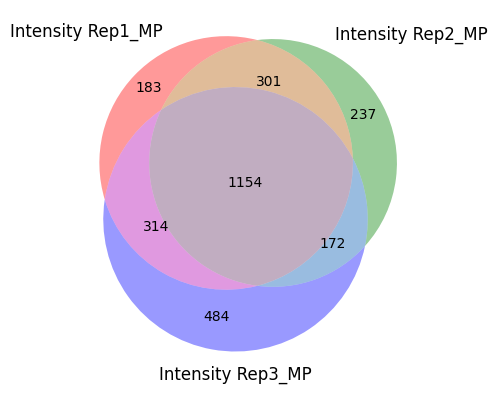

In [21]:
vis.venn_diagram(df_traces[['Intensity Rep1_MP', 'Intensity Rep2_MP', 'Intensity Rep3_MP']].replace(0, np.nan))

## Data preprocessing for all reps:

In [22]:
from sklearn.preprocessing import MinMaxScaler


for rep in range(3):
    intCol= intCols[rep]

    df_filter = df_traces.copy(deep=True)
    df_filter = pp.remove_non_quant(df_filter, intCol)
    ## Filtering dataset by rows which have at least 2 valid values out of 5 columns 'Total', 'SN', 'SN1','SN2', 'MP'
    """
    ## This is based on the assumption that a membrane protein may be enriched only in Total glycosomal and then 
    directly in the membrane pellet with missing values in the washing steps 'SN0', 'SN1' and 'SN2'.
    
    
    """
    df_filter = pp.filter_vv(df_filter, [intCol], n=2, valid_values=True)

    ## Imputing missing values for each row by randomly drawing values from downshifted distribution across rows:
    def impute_per_row(row):
        
        downshift = 1.8
        width = .3
        
        var = np.std(row)
        mean = np.mean(row)

        mean_ = mean - downshift*var
        var_ = var*width

        
        rnd = list(np.random.normal(mean_, var_, size=np.isnan(row).sum()))
        
        idx_noCtrl = row[row.isnull()].index
                
        for i, idx in enumerate(idx_noCtrl):
            row[idx] = rnd[i]
                
        return row
    
    df_filter[intCol] = df_filter[intCol].apply(impute_per_row, axis=1)

    
    df_norm2 = df_filter.copy(deep=True)
    
    ################  MIN-MAX NORMALIZATION ###############################
    df_norm2[intCol] = 10**df_norm2[intCol]

    df_norm2[intCol] = df_norm2[intCol].apply(lambda x: x/max(x), 1)

        
    df_norm2.to_csv("results/dataset1_rep" + str(rep+1) + ".csv", index=False)


4317 rows before filter operation.
2768 rows after filter operation.
2768 rows before filter operation.
1929 rows after filter operation.
4317 rows before filter operation.
2806 rows after filter operation.
2806 rows before filter operation.
1894 rows after filter operation.
4317 rows before filter operation.
3902 rows after filter operation.
3902 rows before filter operation.
2337 rows after filter operation.


## Loading preprocessed dataset from each replicate as a separate dataframe:

As each replicate dataframe is reduced after filtering for valid values and imputing missing values, we load each dataset separately.

In [23]:
rep1 = pp.read_csv("results/dataset1_rep1.csv", sep=',')
rep2 = pp.read_csv("results/dataset1_rep2.csv", sep=',')
rep3 = pp.read_csv("results/dataset1_rep3.csv", sep=',')

## Visualization of traces for QC of marker proteins:

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def create_custom_legend(moi, COLORS=None, ax=None):
    if COLORS is None:
        # Use the 'qualitative' 'Set1' color palette from matplotlib
        COLORS = plt.cm.Set1.colors[:len(moi)]

    # Create a list of Line2D objects for the legend
    legend_elements = [Line2D([0], [0], color=color, lw=4, label=label) for label, color in zip(moi, COLORS)]

    if ax is None:
        # If no axes object is provided, get the current axes
        ax = plt.gca()

    # Add the custom legend to the specified axes object
    ax.legend(handles=legend_elements, loc='best', fontsize='small', title="Marker/Protein")

    return ax

In [ ]:
intCol1 = ['log10_iBAQ Rep1_Total_Glycosome', 'log10_iBAQ Rep1_SN0',
       'log10_iBAQ Rep1_SN1', 'log10_iBAQ Rep1_SN2',
       'log10_iBAQ Rep1_MP']

intCol2 = ['log10_iBAQ Rep2_Total_Glycosome', 'log10_iBAQ Rep2_SN0',
       'log10_iBAQ Rep2_SN1', 'log10_iBAQ Rep2_SN2',
       'log10_iBAQ Rep2_MP']

intCol3 = ['log10_iBAQ Rep3_Total_Glycosome', 'log10_iBAQ Rep3_SN0',
       'log10_iBAQ Rep3_SN1', 'log10_iBAQ Rep3_SN2',
       'log10_iBAQ Rep3_MP']

### Visualizing mean of marker proteins per rep:

In [ ]:
moi = ['Mitochondria','Acidocalcisome','ER', 'Cytoplasm','Nucleus','Nuclear Pore',
             'Cytoskeleton','Plasma membrane','Golgi', 'Glycosomal matrix', 'Glycosomal membrane']

In [ ]:
# Main plotting code
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(15, 3))

for marker, col in zip(moi, COLORS):
    ticks = ['Total', 'SN', 'SN1','SN2', 'MP']
    # Plotting traces for the first replicate
    vis.plot_traces(rep1[rep1['marker'] == marker], intCol1, ax=ax[0], plot_summary_only=True, summary_color=col, ylabel='Norm. Intensity')
    ax[0].set_xticks(range(len(intCol1)), labels=ticks, rotation=40)

    # Plotting traces for the second replicate
    vis.plot_traces(rep2[rep2['marker'] == marker], intCol2, ax=ax[1], plot_summary_only=True, summary_color=col, ylabel='Norm. Intensity')
    ax[1].set_xticks(range(len(intCol2)), labels=ticks, rotation=40)

    # Plotting traces for the third replicate
    vis.plot_traces(rep3[rep3['marker'] == marker], intCol3, ax=ax[2], plot_summary_only=True, summary_color=col, ylabel='Norm. Intensity')
    ax[2].set_xticks(range(len(intCol3)), labels=ticks, rotation=40)

# Adding the custom legend to the last subplot (or to whichever subplot is most appropriate)
create_custom_legend(moi, COLORS, ax[2])


### Visualizing all proteins in a marker list:

In [33]:
moi = ['Mitochondria','Acidocalcisome','ER', 'Cytoplasm','Nucleus','Nuclear Pore',
             'Cytoskeleton','Plasma membrane','Golgi', 'Glycosomal matrix', 'Glycosomal membrane']

In [34]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

def create_custom_legend(moi, COLORS=None, ax=None):
    if COLORS is None:
        # Use the 'qualitative' 'Set1' color palette from matplotlib
        COLORS = plt.cm.Set1.colors[:len(moi)]

    # Create a list of Line2D objects for the legend
    legend_elements = [Line2D([0], [0], color=color, lw=4, label=label) for label, color in zip(moi, COLORS)]

    if ax is None:
        # If no axes object is provided, get the current axes
        ax = plt.gca()

    # Add the custom legend to the specified axes object
    ax.legend(handles=legend_elements, loc='best', fontsize='small', title="Marker/Protein")

    return ax

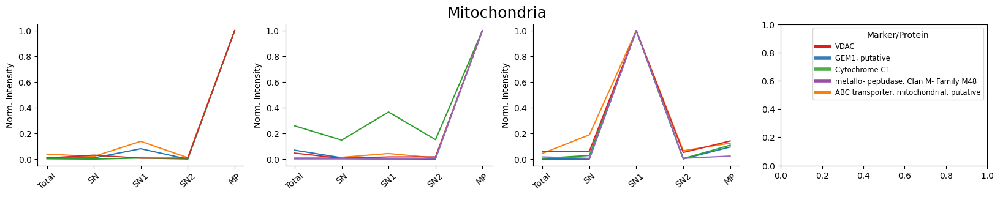

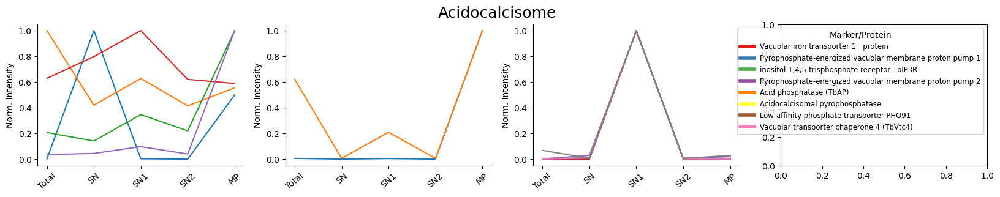

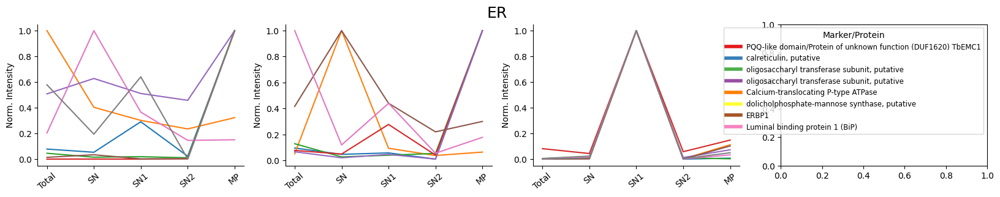

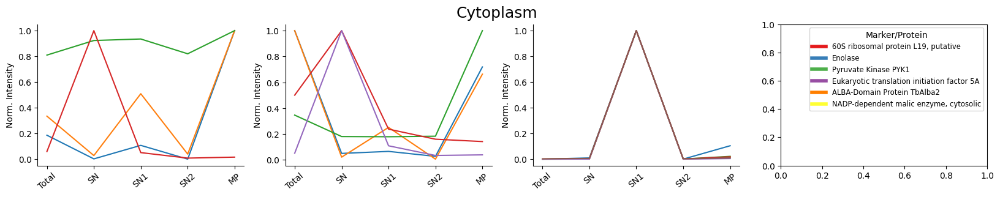

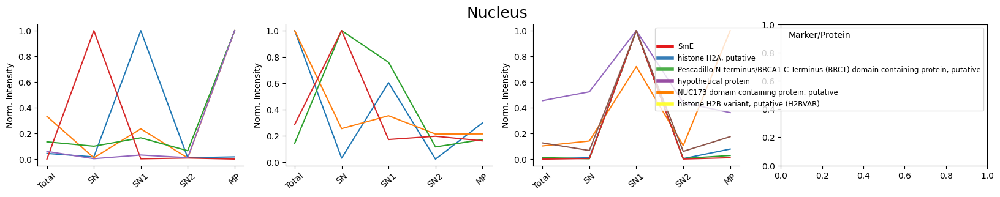

...

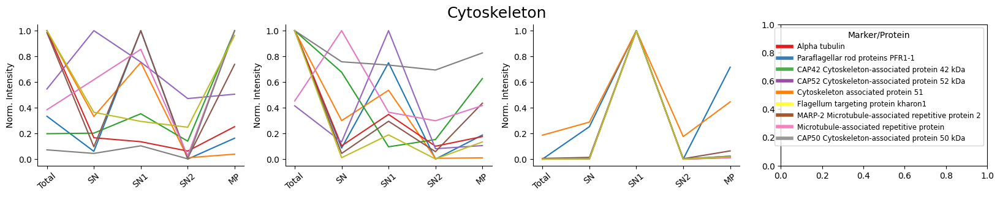

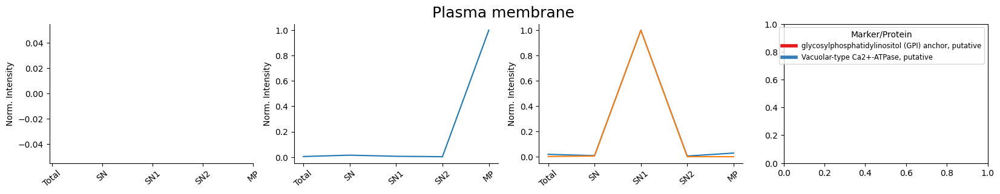

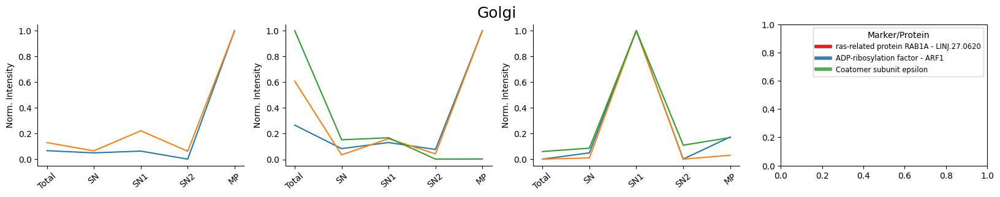

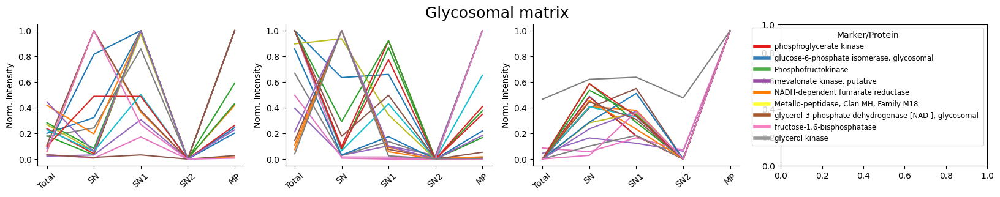

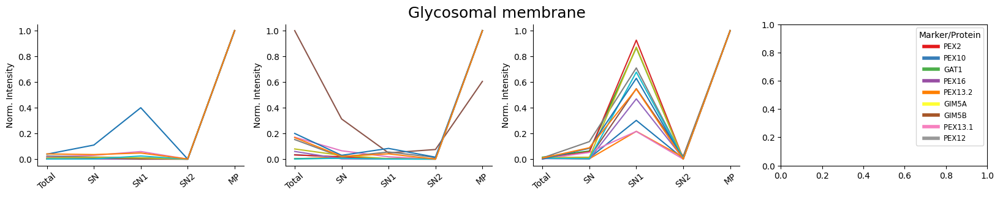

In [35]:
# Main plotting code
# fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(20, 5))

for m, col in zip(moi, COLORS):
    
        
    hlCol = COLORS[HUE_ORDER.index(marker)]

    fig, ax = plt.subplots(nrows=1, ncols=4, figsize=(20,3))
    fig.suptitle(m, size=18)

    ticks = ['Total', 'SN', 'SN1','SN2', 'MP']

    # Plotting traces for the first replicate
    fig = vis.plot_traces(rep1[rep1['marker']==m], intCol1, ax=ax[0], plot_summary_only=False, summary_color=col, ylabel='Norm. Intensity')
    ax[0].set_xticks(range(len(intCol1)), labels=ticks, rotation=40)
    # create_custom_legend(rep1[rep1['marker'] == m]['Description'].to_list(), ax=ax[0])

    # Plotting traces for the second replicate
    fig = vis.plot_traces(rep2[rep2['marker']==m], intCol2, ax=ax[1], plot_summary_only=False, summary_color=col, ylabel='Norm. Intensity')
    ax[1].set_xticks(range(len(intCol2)), labels=ticks, rotation=40)
    # create_custom_legend(rep2[rep2['marker''marker'] == m]['Description'].to_list(), ax=ax[1])

    # Plotting traces for the third replicate
    fig = vis.plot_traces(rep3[rep3['marker']==m], intCol3, ax=ax[2], plot_summary_only=False, summary_color=col, ylabel='Norm. Intensity')
    ax[2].set_xticks(range(len(intCol3)), labels=ticks, rotation=40)
    create_custom_legend(rep3[rep3['marker'] == m]['Description'].to_list(), ax=ax[3])
        
        
# plt.savefig("results/marker_profile_plots" + ".pdf")


## Merging all reps:

In [37]:
Rep1 = rep1[['id'] + rep1.filter(regex='log10_iBAQ Rep1').columns.to_list()]
Rep2 = rep2[['id'] + rep2.filter(regex='log10_iBAQ Rep2').columns.to_list()]
Rep3 = rep3[['id'] + rep3.filter(regex='log10_iBAQ Rep3').columns.to_list()]

In [38]:
Rep1['id'].duplicated().any()

False

In [39]:
df1 = df_marker.merge(Rep1, on='id', how='left')
df2 = df1.merge(Rep2, on='id', how='left')
df3 = df2.merge(Rep3, on='id', how='left')

## PCP of conditions:

In [41]:
from scipy.stats import pearsonr

def calcCorr(y1,y2):
    #center traces 
    y1 = [i-np.mean(y1) for i in y1]
    y2 = [i-np.mean(y2) for i in y2]
    return pearsonr(y1, y2)[0]


reps = [rep1, rep2, rep3]
ints = [intCol1, intCol2, intCol3]

dcorr1, dcorr2, dcorr3 = [], [], []
dcorrs = [dcorr1, dcorr2, dcorr3]

for rep, inte, dcorr in zip(reps, ints, dcorrs):
    poxMean = rep.loc[rep["marker"]=='Glycosomal membrane',inte].mean(0)
    
    
    for i in range(rep.shape[0]):
        test = rep.iloc[i][inte].astype(float)

        poxSim = calcCorr(poxMean, test)
        dcorr.append(poxSim)

In [42]:
rep1["dcorr_Glyco-mem"] = dcorrs[0]
rep2["dcorr_Glyco-mem"] = dcorrs[1]
rep3["dcorr_Glyco-mem"] = dcorrs[2]

Merging dataframes:

In [44]:
rep_1 =  rep1[['id','dcorr_Glyco-mem']]
rep_1 = rep_1.add_suffix("_Rep1")
df_merge1 = df3.merge(rep_1[['id_Rep1','dcorr_Glyco-mem_Rep1']], left_on='id',right_on='id_Rep1',how='left')

rep_2 =  rep2[['id','dcorr_Glyco-mem']]
rep_2 = rep_2.add_suffix("_Rep2")
df_merge2 = df_merge1.merge(rep_2[['id_Rep2','dcorr_Glyco-mem_Rep2']], left_on='id',right_on='id_Rep2',how='left')

rep_3 =  rep3[['id','dcorr_Glyco-mem']]
rep_3 = rep_3.add_suffix("_Rep3")
df_merge3 = df_merge2.merge(rep_3[['id_Rep3','dcorr_Glyco-mem_Rep3']], left_on='id',right_on='id_Rep3',how='left')

In [45]:
df_pcp = df_merge3.copy(deep=True)

In [46]:
corr_col = ['dcorr_Glyco-mem_Rep1', 'dcorr_Glyco-mem_Rep2', 'dcorr_Glyco-mem_Rep3']

In [47]:
df_pcp[corr_col]

,dcorr_Glyco-mem_Rep1,dcorr_Glyco-mem_Rep2,dcorr_Glyco-mem_Rep3
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,0.944834,0.311737,0.552193
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
4312,NaN,NaN,NaN
4313,0.727134,-0.281847,0.395438
4314,0.966690,0.822912,0.332120
4315,NaN,NaN,NaN


In [48]:
df_pcp = pp.filter_vv(df_pcp, [corr_col], n=2, valid_values=True)

4317 rows before filter operation.
2001 rows after filter operation.


In [49]:
df_pcp = pp.imp_seq(df_pcp, corr_col)

In [50]:
df_pcp.filter(regex='_imputed').columns

Index(['dcorr_Glyco mem_Rep1_imputed', 'dcorr_Glyco mem_Rep2_imputed',
       'dcorr_Glyco mem_Rep3_imputed'],
      dtype='object')

In [51]:
corr_col = ['dcorr_Glyco mem_Rep1_imputed', 'dcorr_Glyco mem_Rep2_imputed','dcorr_Glyco mem_Rep3_imputed']

## Rank-Product Test:

In [52]:
df_1 = ana.rank_prod(df_pcp, reps=['dcorr_Glyco-mem_Rep1', 'dcorr_Glyco-mem_Rep2', 'dcorr_Glyco-mem_Rep3'], cond='_Glyco-mem_PCP', correct_fc = True)

rankProd: Assuming a one sample test


## Interactive plots PCP Analysis 1: 

In [53]:
key = 'class1>class2_Glyco-mem_PCP'

In [54]:
list(df_pcp.columns)

['Protein IDs',
 'Majority protein IDs',
 'Peptide counts (all)',
 'Peptide counts (razor+unique)',
 'Peptide counts (unique)',
 'Fasta headers',
 'Number of proteins',
 'Peptides',
 'Razor + unique peptides',
 'Unique peptides',
 'Peptides Rep1_Density_F11',
 'Peptides Rep1_Density_F12',
 'Peptides Rep1_Density_F13',
 'Peptides Rep1_Density_F14',
 'Peptides Rep1_Density_F15',
 'Peptides Rep1_Density_F16',
 'Peptides Rep1_Density_F17',
 'Peptides Rep1_Density_F18',
 'Peptides Rep1_Density_F19',
 'Peptides Rep1_Density_F20',
 'Peptides Rep1_Density_F21',
 'Peptides Rep1_Density_F22',
 'Peptides Rep1_MP',
 'Peptides Rep1_SN0',
 'Peptides Rep1_SN1',
 'Peptides Rep1_SN2',
 'Peptides Rep1_Total_Glycosome',
 'Peptides Rep2_MP',
 'Peptides Rep2_OP',
 'Peptides Rep2_SN0',
 'Peptides Rep2_SN1',
 'Peptides Rep2_SN2',
 'Peptides Rep2_Total_Glycosome',
 'Peptides Rep3_Total_Glycosome',
 'Peptides Rep3_OP',
 'Peptides Rep3_SN1',
 'Peptides Rep3_SN0',
 'Peptides Rep3_SN2',
 'Peptides Rep3_MP',
 'Raz

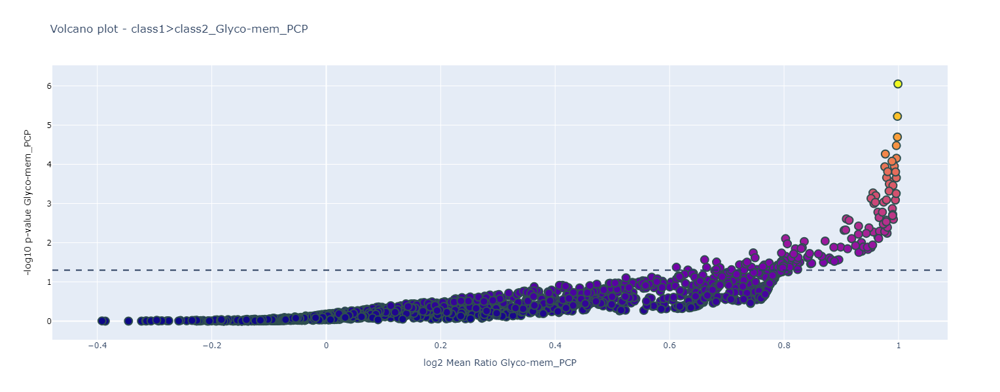

In [55]:
#### PLOTLY INTERACTIVE PLOT ####
key = 'class1>class2_Glyco-mem_PCP'
df_1['negative_PValue'] = np.log10(df_1['PValue_' + key]) * (-1)

fig = go.Figure()
trace1 = go.Scatter(
 x=df_1['logFC_Glyco-mem_PCP'],
 y=df_1['negative_PValue'],
 mode='markers',
    marker_color=df_1['negative_PValue'],
 hovertext = [
    f"{protein_ids.split(';')[0]}; {fasta_header1.split(';')[0]}"
    for protein_ids, fasta_header1 in zip(
        df_1["Majority protein IDs"],
        df_1["Fasta headers"].fillna('')
    )
]
)

fig.add_trace(trace1)
# fig.add_trace(trace2)
# fig.add_trace(trace3)
# fig.add_trace(trace4)
fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.add_hline(y=1.3, line_dash="dash")
#fig.add_vline(x=1, line_dash="dash")
#fig.add_vline(x=-1, line_dash="dash")
fig.update_layout(title='Volcano plot - ' + key ,xaxis=dict(title="log2 Mean Ratio Glyco-mem_PCP"),
    yaxis=dict(title="-log10 p-value Glyco-mem_PCP"),
    autosize=False,
    width=800,  # Set the width of the figure
    height=600)  # Set the height of the figure)
#fig.update_layout(plot_bgcolor="white")
fig.update_yaxes(color='black', layer='above traces')

fig.show()
# fig.write_html(rootdir + r"/PCP_Glyco-membrane_v02.html")

## Volcano plots:

In [56]:
df_1['marker'].unique()

array([nan, 'Glyco_Cyto', 'Glycosomal matrix', 'Cytoskeleton',
       'Mitochondria', 'Nuclear Pore', 'Glyco_mito',
       'Glycosomal membrane', 'ER', 'Acidocalcisome', 'Nucleus',
       'Cytoplasm', 'Golgi', 'Plasma membrane'], dtype=object)

In [57]:
df_1["Majority protein IDs_1st"] = df_1["Majority protein IDs"].str.split(";").str.get(0)

In [58]:
COLORS = [ "cyan", "#dede00", "#377eb8", "#ffff00", "#e68a00", "#99ccff", 
          "#00ffcc", "#ff99ff", "#00b386","pink", "magenta"]


HUE_ORDER = ['Mitochondria','Acidocalcisome','ER', 'Cytoplasm','Nucleus','Nuclear Pore',
             'Cytoskeleton','Plasma membrane','Golgi', 'Glycosomal matrix', 'Glycosomal membrane']

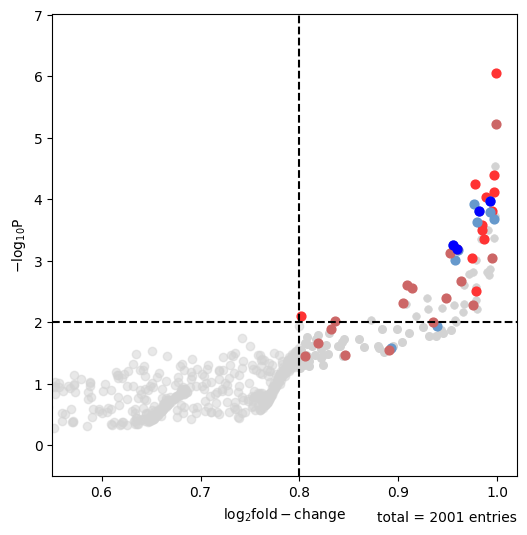

In [172]:
default_highlight_kwargs = {
    "marker": "o",  # set highlight shape to circle
    "s": 30,  # set highlight size to 100
    "alpha": 1,  # set highlight alpha to 0.8
}



fig = vis.volcano(df_1,log_fc_colname="logFC_Glyco-mem_PCP", 
            p_colname='PValue_class1>class2_Glyco-mem_PCP',
            p_thresh=0.01,log_fc_thresh = 0.8,
            annotate_colname = "Majority protein IDs",
            figsize= (6, 6),
                  show_legend=False,
            annotate_density=1,
   highlight=[
        df_1[df_1['marker']=='Glycosomal membrane'].index,
        df_1[df_1['Majority protein IDs'].isin(glyco_candidates)].index,
       df_1[df_1['Majority protein IDs'].isin(glyco_dual)].index,
       df_1[df_1['Majority protein IDs'].isin(poi)].index,
   ]
        ,
    annotate="highlight",
    kwargs_highlight=[
        default_highlight_kwargs
        | {
            "color": "#FF3333",  # set highlight color to red
            "label": "Glycosomal membrane",  # set highlight label
             "s": 40
        }, 
    default_highlight_kwargs
        | {
            "color": "#6699CC",  # set highlight color to red
            "label": "Glyco. dual loc. candidate",  # set highlight label
             "s": 40
        },
           default_highlight_kwargs
        | {
            "color": "#CC6666",  # set highlight color to red
            "label": "Glycosomal membrane",  # set highlight label
             "s": 40
        },
        default_highlight_kwargs
        | {
            "color": "blue",  # set highlight color to red
            "label": "Glycosomal membrane",  # set highlight label
            "s": 40
        },
    ],
    kwargs_both_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        #      'edgecolors': '#58b3e8',    # set highlight edge colors to black
        "linewidths": 0.5,  # set highlight linewidths to 0.5
        "label": None,  # set highlight label
    },
    kwargs_log_fc_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        "label": None,  # set highlight label
    },
    kwargs_p_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        # set highlight edge colors to black
        "linewidths": 0.5,  # set highlight linewidths to 0.5
        "label": None,  # set highlight label
    }    
    )
plt.xlim(0.55,1.02)
plt.ylim(-0.5,7.02)
# plt.savefig(rootdir + '/VolcanoPlot_Classes_combined_annotated_hd_20240906.pdf')

## Data export:

In [62]:
df_1.to_csv( "results/PCP_dataset1_combined.csv", index=False)

# Analysis 2: PCP of Density-gradient fractions:

## Selecting density-gradient rows:

In [63]:
df = df_marker.copy(deep=True)

In [64]:
ointCols = ['iBAQ Rep1_Density_F11', 'iBAQ Rep1_Density_F12',
       'iBAQ Rep1_Density_F13', 'iBAQ Rep1_Density_F14',
       'iBAQ Rep1_Density_F15', 'iBAQ Rep1_Density_F16',
       'iBAQ Rep1_Density_F17', 'iBAQ Rep1_Density_F18',
       'iBAQ Rep1_Density_F19', 'iBAQ Rep1_Density_F20',
       'iBAQ Rep1_Density_F21', 'iBAQ Rep1_Density_F22']

In [65]:
df[ointCols] = df[ointCols].replace(0, np.nan)

In [66]:
df2 = pp.remove_non_quant(df, ointCols)

4317 rows before filter operation.
4185 rows after filter operation.


In [67]:
df2, intCols = pp.log(df2, ointCols, base=10, return_cols=True)

In [68]:
df2["UID"] = range(1, df2.shape[0]+1)

Visualization of missing values:

True

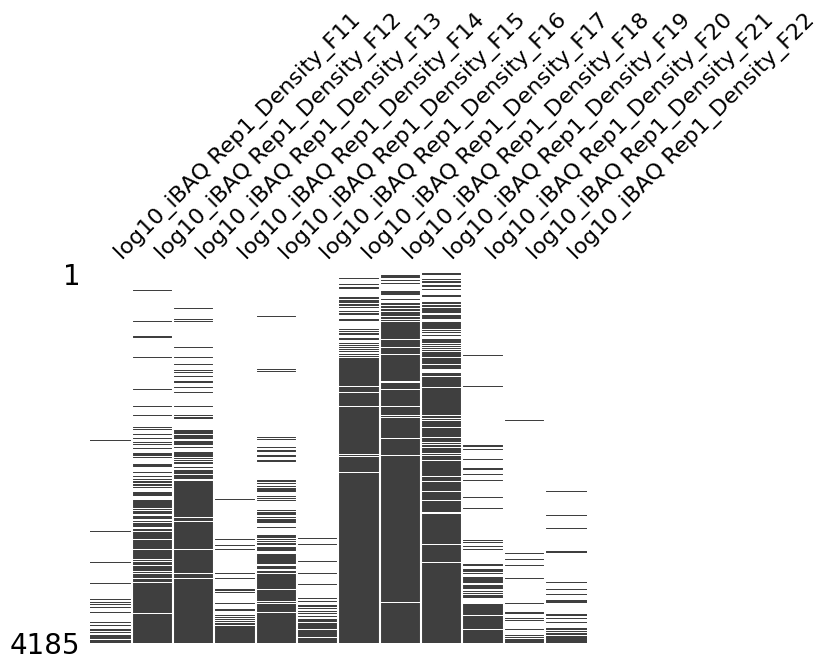

In [69]:
ana.miss_analysis(df2, intCols, text=False, vis=False, extra_vis=True, save_dir=None)

## PCP of density-fractions:

4185 rows before filter operation.
3853 rows after filter operation.


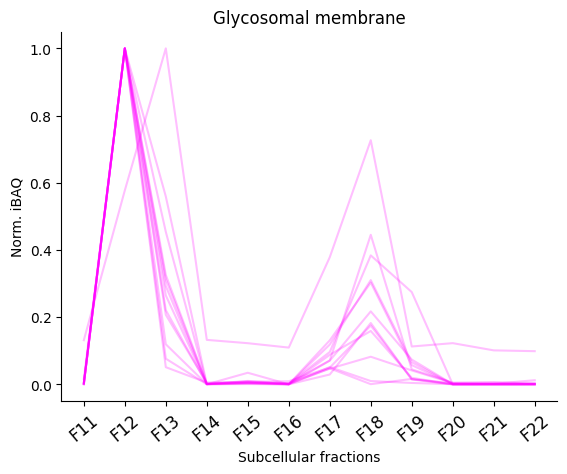

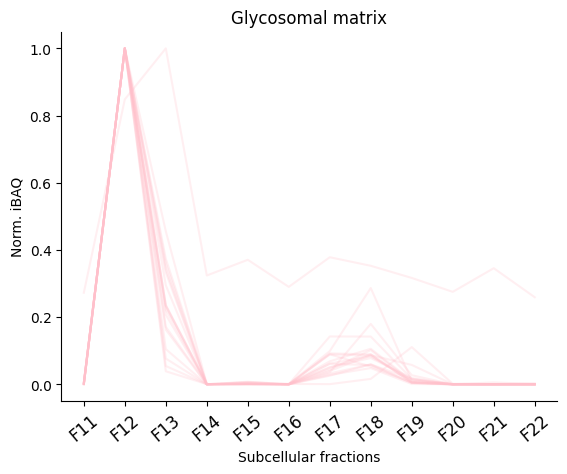

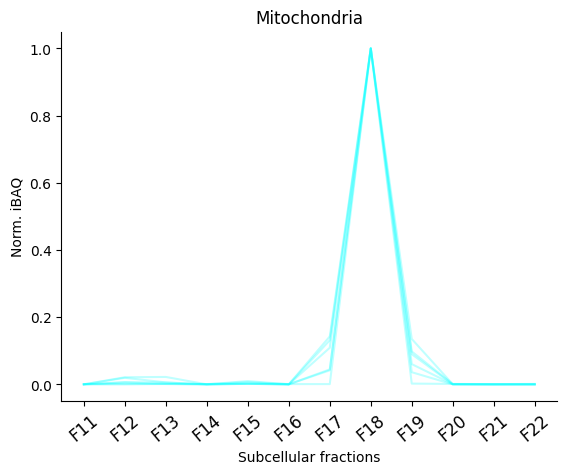

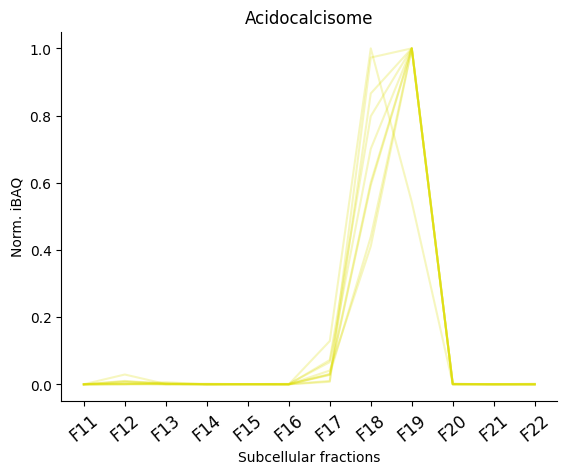

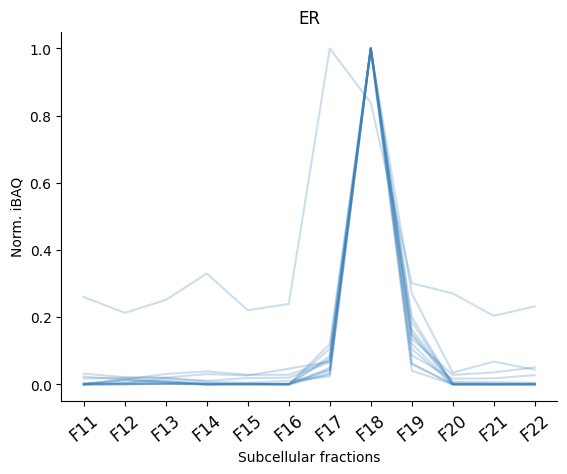

...

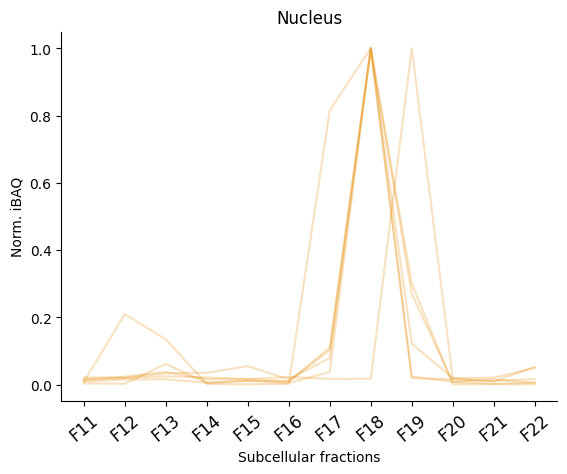

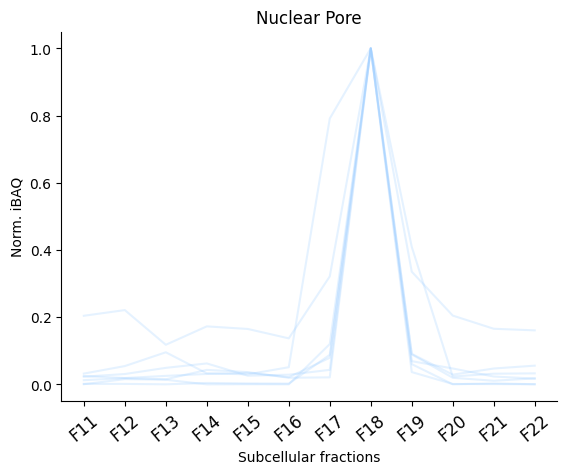

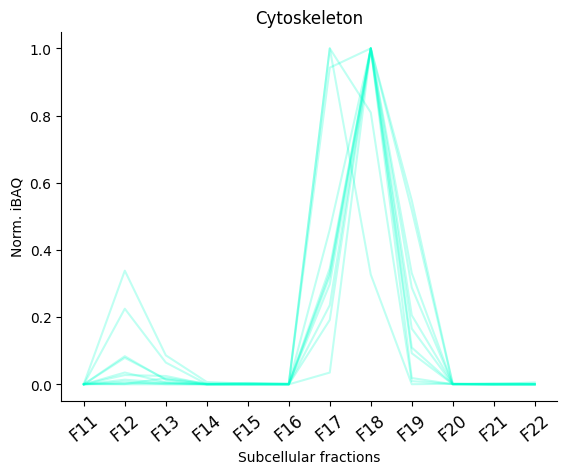

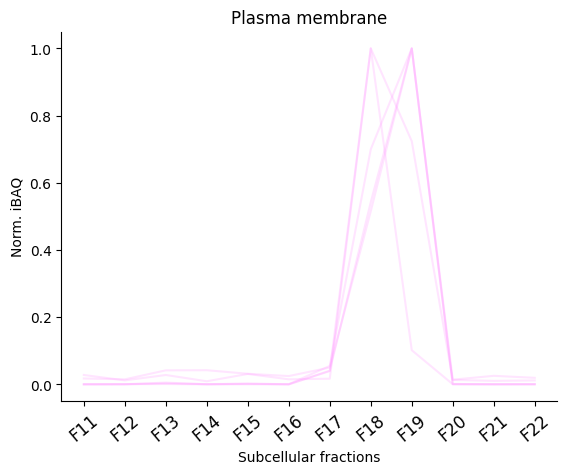

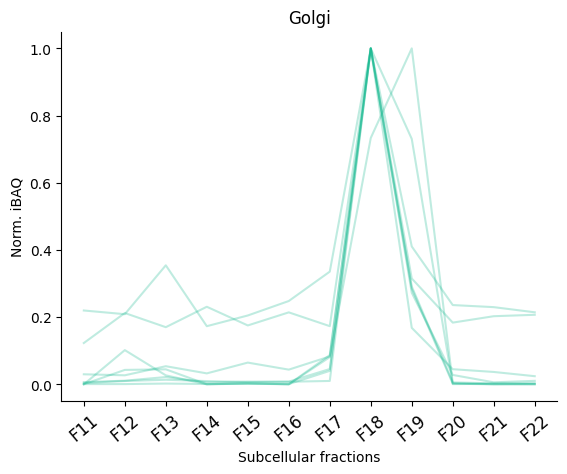

In [70]:
from sklearn.preprocessing import MinMaxScaler

intCol= intCols

df_filter = df2.copy(deep=True)
df_filter = pp.filter_vv(df_filter, [intCol], n=2, valid_values=True)

# df_filter[intCols1].to_csv(rootdir + "/data/rawIntCols_hd015.tsv", sep='\t', index=False)

def impute_per_row(row):

    downshift = 1.8
    width = .3

    var = np.std(row)
    mean = np.mean(row)

    mean_ = mean - downshift*var
    var_ = var*width

    #mean_ = 2
    #var_ = .3

    rnd = list(np.random.normal(mean_, var_, size=np.isnan(row).sum()))

    idx_noCtrl = row[row.isnull()].index

    for i, idx in enumerate(idx_noCtrl):
        row[idx] = rnd[i]

    return row

df_filter[intCol] = df_filter[intCol].apply(impute_per_row, axis=1)

df_norm2 = df_filter.copy(deep=True)

################  MIN-MAX NORMALIZATION ###############################
df_norm2[intCol] = 10**df_norm2[intCol]

df_norm2[intCol] = df_norm2[intCol].apply(lambda x: x/max(x), 1)

########Traces################

moi = ['Glycosomal membrane', 'Glycosomal matrix','Mitochondria','Acidocalcisome',
           'ER', 'Cytoplasm','Nucleus','Nuclear Pore','Cytoskeleton','Plasma membrane','Golgi']

for marker in moi:

    hlCol = COLORS[HUE_ORDER.index(marker)]

#         fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(7,5))
#         plt.title(marker, size=18)
    forVis = df_norm2[df_norm2["marker"]==marker]

    
    ticks = ['F11','F12', 'F13','F14','F15','F16', 'F17','F18','F19', 'F20','F21','F22']
    
        
    vis.plot_traces(forVis,cols=intCol,  alpha=.25,
                   plot_summary=False,summary_type='Mean', title=marker, color=hlCol,ylabel= "Norm. iBAQ",  xlabel= "Subcellular fractions")
    plt.xticks(range(len(intCol)),labels=ticks, rotation=40,fontsize=12)
    
#     plt.savefig(rootdir + "/plots/Traces_Density_" + str(marker) + "_profile.pdf")
#     plt.title(marker)



    
#     vis.plotTraces(forVis,cols=intCol, alpha=1,title=marker,
#                    plotSummary=True, summaryColor=hlCol,ylabel= "Norm. Intensity")

    df_norm2.to_csv("results/dataset2_gradient"  + ".csv", index=False)

Reading saved data:

## Calculation of correlation:

In [71]:
rep1 = pp.read_csv("results/dataset2_gradient.csv", sep=',')

In [72]:
intCol1 = rep1.filter(regex='log10.*Density').columns.to_list()

In [73]:
intCol1

['log10_iBAQ Rep1_Density_F11',
 'log10_iBAQ Rep1_Density_F12',
 'log10_iBAQ Rep1_Density_F13',
 'log10_iBAQ Rep1_Density_F14',
 'log10_iBAQ Rep1_Density_F15',
 'log10_iBAQ Rep1_Density_F16',
 'log10_iBAQ Rep1_Density_F17',
 'log10_iBAQ Rep1_Density_F18',
 'log10_iBAQ Rep1_Density_F19',
 'log10_iBAQ Rep1_Density_F20',
 'log10_iBAQ Rep1_Density_F21',
 'log10_iBAQ Rep1_Density_F22']

In [74]:
from scipy.stats import pearsonr
from sklearn.metrics import auc
import numpy as np

def calcMagnitude(y1, y2):
    auca = auc(range(len(y1)), y1)
    aucb = auc(range(len(y2)), y2)
    mcomp = (auca - aucb) / (auca + aucb)
    return abs(mcomp)

def calcCorr(y1, y2):
    # center traces
    y1 = [i - np.mean(y1) for i in y1]
    y2 = [i - np.mean(y2) for i in y2]
    return pearsonr(y1, y2)[0]

def calcSim(y1, y2):
    pComp = calcCorr(y1, y2)
    mComp = calcMagnitude(y1, y2)
    if pComp < 0 and mComp < 0:
        return np.nan
    return -np.log10(pComp * mComp)

rep = rep1
inte = intCol1

poisIdx = []
sim = []
dcorr = []

poxMean = rep.loc[rep["marker"] == 'Glycosomal membrane', inte].mean(0)

for i in range(rep.shape[0]):
    test = rep.iloc[i][inte].astype(float)

    poxSim = calcCorr(poxMean, test)
    dcorr.append(poxSim)

    sims = [poxSim]
    sims = [i if ~np.isnan(i) else 0 for i in sims]

    if sum(sims) == 0:
        idx = -999
    else:
        try:
            idx = sims.index(max(sims))
        except:
            idx = -999

    if idx == 0:
        poisIdx.append(i)

    sim.append(idx)

In [75]:
rep1['dCorr_Density_gradient'] = dcorr

In [76]:
rep1.loc[(rep1['dCorr_Density_gradient']>0.90) & (rep1['marker'].str.contains('Gly'))][['Fasta headers', 'marker']]

,Fasta headers,marker
63,"Phosphoglycerate kinase, putative",Glycosomal matrix
131,"Phosphoglucose isomerase, putative",Glycosomal matrix
347,Pex2 / Pex12 amino terminal region containing ...,Glycosomal membrane
350,Pex2 / Pex12 amino terminal region/Zinc finger...,Glycosomal membrane
383,"Phosphofructokinase, putative",Glycosomal matrix
675,ABC transporter transmembrane region 2/ABC tra...,Glycosomal membrane
676,GHMP kinases N terminal domain/GHMP kinases C ...,Glycosomal matrix
847,"FAD binding domain/D-arabinono-1,4-lactone oxi...",Glycosomal matrix
1586,Peptidase family M20/M25/M40/Peptidase dimeris...,Glycosomal matrix
2009,"Peroxisomal membrane protein (Pex16), putative",Glycosomal membrane


In [77]:
df2

,Protein IDs,Majority protein IDs,Peptide counts (all),Peptide counts (razor+unique),Peptide counts (unique),Fasta headers,Number of proteins,Peptides,Razor + unique peptides,Unique peptides,...,log10_iBAQ Rep1_Density_F13,log10_iBAQ Rep1_Density_F14,log10_iBAQ Rep1_Density_F15,log10_iBAQ Rep1_Density_F16,log10_iBAQ Rep1_Density_F17,log10_iBAQ Rep1_Density_F18,log10_iBAQ Rep1_Density_F19,log10_iBAQ Rep1_Density_F20,log10_iBAQ Rep1_Density_F21,log10_iBAQ Rep1_Density_F22
0,Tb427_000013100;Tb427_000005600,Tb427_000013100;Tb427_000005600,2;2,2;2,1;1,Trypanosome variant surface glycoprotein (A-ty...,2,2,2,1,...,NaN,NaN,NaN,NaN,NaN,4.652256,4.860596,NaN,NaN,NaN
1,Tb427_000023800;Tb427_000012500;Tb427_00000820...,Tb427_000023800;Tb427_000012500;Tb427_00000820...,6;6;6;6;5;5;3,1;1;1;1;1;1;1,1;1;1;1;1;1;1,"BT1 family, putative ;BT1 family, putative ;BT...",7,6,1,1,...,NaN,NaN,NaN,NaN,4.799492,NaN,6.175222,NaN,NaN,NaN
2,Tb427_000012900,Tb427_000012900,16,16,16,"Phosphotransferase enzyme family, putative",1,16,16,16,...,5.262475,NaN,4.369624,NaN,6.271261,7.181071,6.566048,NaN,NaN,NaN
3,Tb427_070082800;Tb427_000024800;Tb427_00002290...,Tb427_070082800;Tb427_000024800;Tb427_00002290...,1;1;1;1;1;1,1;1;1;1;1;1,1;1;1;1;1;1,"hypothetical protein, conserved ;hypothetical ...",6,1,1,1,...,NaN,NaN,NaN,NaN,NaN,5.172749,5.100129,NaN,NaN,NaN
4,Tb427_000104800,Tb427_000104800,2,2,2,Trypanosome variant surface glycoprotein (A-ty...,1,2,2,2,...,4.359342,NaN,NaN,NaN,4.400642,6.458940,4.567215,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4311,Tb427_110189200,Tb427_110189200,10,10,10,ABC transporter transmembrane region/ABC trans...,1,10,10,10,...,NaN,NaN,3.744356,NaN,5.030600,6.559356,5.008302,NaN,NaN,NaN
4312,Tb427_110189600,Tb427_110189600,9,9,9,"Calcineurin-like phosphoesterase, putative",1,9,9,9,...,NaN,NaN,NaN,NaN,5.019324,5.959027,6.096423,NaN,NaN,NaN
4313,Tb427_110189700,Tb427_110189700,8,8,8,"DnaJ domain containing protein, putative",1,8,8,8,...,NaN,NaN,NaN,NaN,5.379795,5.066363,5.004923,NaN,NaN,NaN
4314,Tb427_110189900,Tb427_110189900,40,40,40,Leucine rich repeat/Leucine-rich repeat/Leucin...,1,40,40,40,...,4.488057,NaN,3.669056,NaN,6.331225,6.931422,6.231928,3.691824,NaN,NaN


## Merging with Analysis1:

In [78]:
rep1[['id', 'dCorr_Density_gradient']+ intCol1]

,id,dCorr_Density_gradient,log10_iBAQ Rep1_Density_F11,log10_iBAQ Rep1_Density_F12,log10_iBAQ Rep1_Density_F13,log10_iBAQ Rep1_Density_F14,log10_iBAQ Rep1_Density_F15,log10_iBAQ Rep1_Density_F16,log10_iBAQ Rep1_Density_F17,log10_iBAQ Rep1_Density_F18,log10_iBAQ Rep1_Density_F19,log10_iBAQ Rep1_Density_F20,log10_iBAQ Rep1_Density_F21,log10_iBAQ Rep1_Density_F22
0,171,-0.019433,0.512004,0.542363,0.487769,0.505157,0.503877,0.523462,0.485030,0.618957,1.000000,0.519361,0.506244,0.504392
1,172,-0.095756,0.009775,0.014650,0.008590,0.009806,0.010798,0.008907,0.042099,0.013864,1.000000,0.008884,0.012096,0.006187
2,175,0.105405,0.000878,0.022042,0.012062,0.001890,0.001544,0.000459,0.123080,1.000000,0.242648,0.000190,0.002365,0.001397
3,176,0.012692,0.785991,0.761756,0.785642,0.761265,0.792586,0.787080,0.776482,1.000000,0.846019,0.739914,0.819931,0.774055
4,183,0.115524,0.001409,0.002295,0.007951,0.000202,0.000421,0.000446,0.008744,1.000000,0.012831,0.002645,0.002411,0.001143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3848,4576,0.110672,0.000772,0.000702,0.000579,0.000736,0.001531,0.000236,0.029597,1.000000,0.028116,0.000308,0.000589,0.000446
3849,4577,0.015924,0.042106,0.080431,0.056279,0.039484,0.041672,0.040849,0.083734,0.728792,1.000000,0.060168,0.035845,0.049181
3850,4578,-0.012661,0.271550,0.328562,0.323428,0.306451,0.301035,0.325051,1.000000,0.485924,0.421821,0.359566,0.317761,0.276497
3851,4579,0.082696,0.000160,0.002366,0.003603,0.000221,0.000547,0.000006,0.251074,1.000000,0.199759,0.000576,0.000014,0.000032


In [79]:
df_2 = df_main.merge(rep1[['id', 'dCorr_Density_gradient']+ intCol1], on='id', how='left')

In [80]:
df_2

,Protein IDs,Majority protein IDs,Peptide counts (all),Peptide counts (razor+unique),Peptide counts (unique),Fasta headers,Number of proteins,Peptides,Razor + unique peptides,Unique peptides,...,log10_iBAQ Rep1_Density_F13,log10_iBAQ Rep1_Density_F14,log10_iBAQ Rep1_Density_F15,log10_iBAQ Rep1_Density_F16,log10_iBAQ Rep1_Density_F17,log10_iBAQ Rep1_Density_F18,log10_iBAQ Rep1_Density_F19,log10_iBAQ Rep1_Density_F20,log10_iBAQ Rep1_Density_F21,log10_iBAQ Rep1_Density_F22
0,Tb427_000013100;Tb427_000005600,Tb427_000013100;Tb427_000005600,2;2,2;2,1;1,Trypanosome variant surface glycoprotein (A-ty...,2,2,2,1,...,0.487769,0.505157,0.503877,0.523462,0.485030,0.618957,1.000000,0.519361,0.506244,0.504392
1,Tb427_000023800;Tb427_000012500;Tb427_00000820...,Tb427_000023800;Tb427_000012500;Tb427_00000820...,6;6;6;6;5;5;3,1;1;1;1;1;1;1,1;1;1;1;1;1;1,"BT1 family, putative ;BT1 family, putative ;BT...",7,6,1,1,...,0.008590,0.009806,0.010798,0.008907,0.042099,0.013864,1.000000,0.008884,0.012096,0.006187
2,Tb427_000012900,Tb427_000012900,16,16,16,"Phosphotransferase enzyme family, putative",1,16,16,16,...,0.012062,0.001890,0.001544,0.000459,0.123080,1.000000,0.242648,0.000190,0.002365,0.001397
3,Tb427_070082800;Tb427_000024800;Tb427_00002290...,Tb427_070082800;Tb427_000024800;Tb427_00002290...,1;1;1;1;1;1,1;1;1;1;1;1,1;1;1;1;1;1,"hypothetical protein, conserved ;hypothetical ...",6,1,1,1,...,0.785642,0.761265,0.792586,0.787080,0.776482,1.000000,0.846019,0.739914,0.819931,0.774055
4,Tb427_000104800,Tb427_000104800,2,2,2,Trypanosome variant surface glycoprotein (A-ty...,1,2,2,2,...,0.007951,0.000202,0.000421,0.000446,0.008744,1.000000,0.012831,0.002645,0.002411,0.001143
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4312,Tb427_110189600,Tb427_110189600,9,9,9,"Calcineurin-like phosphoesterase, putative",1,9,9,9,...,0.056279,0.039484,0.041672,0.040849,0.083734,0.728792,1.000000,0.060168,0.035845,0.049181
4313,Tb427_110189700,Tb427_110189700,8,8,8,"DnaJ domain containing protein, putative",1,8,8,8,...,0.323428,0.306451,0.301035,0.325051,1.000000,0.485924,0.421821,0.359566,0.317761,0.276497
4314,Tb427_110189900,Tb427_110189900,40,40,40,Leucine rich repeat/Leucine-rich repeat/Leucin...,1,40,40,40,...,0.003603,0.000221,0.000547,0.000006,0.251074,1.000000,0.199759,0.000576,0.000014,0.000032
4315,Tb427_110190000,Tb427_110190000,1,1,1,"Rab5-interacting protein (Rab5ip), putative",1,1,1,1,...,0.027750,0.042015,0.028515,0.030564,0.062905,1.000000,0.202198,0.037133,0.028201,0.060845


## Data export:

In [81]:
rep1.to_csv("results/PCP_dataset2_combined.csv", index=False)

# Final data export:

 Dropping columns not required:

In [82]:
notcols = df_2.filter(regex='class1<class2_').columns.to_list()
df_2 = df_2.drop(columns=notcols)

In [83]:
df_2["Majority protein IDs_1st"] = df_2["Majority protein IDs"].str.split(";").str.get(0)

In [84]:
merge1 = pd.merge(df_main, df_1,how="left", on ='id', suffixes=('', '_y'))
merge1.drop(merge1.filter(regex='_y$').columns.tolist(),axis=1, inplace=True)

In [85]:
merge2 = pd.merge(merge1, df_2,how="left", on ='id', suffixes=('', '_y'))
merge2.drop(merge2.filter(regex='_y$').columns.tolist(),axis=1, inplace=True)

In [87]:
notcols = merge2.filter(regex='class1<class2_').columns.to_list()
merge2 = merge2.drop(columns=notcols)

In [88]:
merge2.to_excel("results/Results_Tb_membrane_protein_inventory.xlsx", index=False)

In [89]:
merge2.to_csv("results/Results_Tb_membrane_protein_inventory.csv", index=False)

# Data visualization- Plots on manuscript:

## Loading dataset after manual filtering and validation steps:

In [191]:
data = pd.read_csv("txt/for_plots_Results_Tb_membrane_protein_inventory.txt", sep='\t', encoding='Windows-1252')
data.sample(1)

,Protein group ID,ID'ed in Moloney et al.,tagm.map.localisation.prediction,Protein IDs (Tb427),Majority protein IDs (Tb427),Protein IDs (Both 427 and 927),Majority protein IDs (Both 427 and 927),Protein description,Guther et al. Name,Guther et al. Description,...,F13,F14,F15,F16,F17,F18,F19,F20,F21,F22
3540,3098,NaN,NaN,Tb427_100060900,Tb427_100060900,Tb427_100060900;Tb927.10.5670,Tb427_100060900;Tb927.10.5670,"NMDA receptor-regulated protein 1, putative",NaN,"N-acetyltransferase subunit Nat1, putative",...,0.111639,0.017695,0.010583,0.013785,0.72345,0.593045,1.0,0.012059,0.029659,0.014121


## Bar plots: Function

In [192]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

def plot_bar(df, cols, barcolor='blue', edgecolor='black', edge_linewidth=1, edge_linetype='solid',
             grouped_cols=None, xtick_labels=None, stats=False, figsize=(10, 6),
             label_rotation=None, bar_closeness=2, legend_name=None, legend_position='upper right', index=None, save_path=None, font='Arial',
             grouped_type='mean', stat='std'):

    plt.rcParams['font.family'] = font

    if index is not None:
        df = df.loc[index, :]

    if grouped_cols is None:
        grouped_cols = [cols]

    fig, ax = plt.subplots(figsize=figsize)
    
    bar_closeness = max(0, min(5, bar_closeness))  # Ensure bar_closeness is within the range [0, 5]
    barwidth = 1 / (len(grouped_cols) + bar_closeness * 0.1)

    for idx, group in enumerate(grouped_cols):
        group_data = df[group]

        if stats:
            if grouped_type == 'mean':
                means = group_data.mean()
            if stat == 'std':
                std_devs = group_data.std()
        else:
            means = group_data.mean()
            std_devs = None

        ind = np.arange(len(group))
        rects = ax.bar(ind + idx * barwidth, means, barwidth, color=barcolor, edgecolor=edgecolor, linewidth=edge_linewidth, linestyle=edge_linetype, label=legend_name)

        if stats and std_devs is not None:
            for rect, std_dev in zip(rects, std_devs):
                height = rect.get_height()
                ax.errorbar(rect.get_x() + rect.get_width() / 2, height, yerr=std_dev, color='black', capsize=3, linewidth=1)

    if xtick_labels is None:
        xtick_labels = cols

    ax.set_xticks(ind + barwidth * (len(grouped_cols) - 1) / 2)
    ax.set_xticklabels(xtick_labels, rotation=label_rotation)

    if legend_name:
        if legend_position == 'upper right':
            bbox_to_anchor = (1.05, 1)
            loc = 'upper left'
        elif legend_position == 'upper left':
            bbox_to_anchor = (0, 1)
            loc = 'upper right'
        elif legend_position == 'lower right':
            bbox_to_anchor = (1.05, 0)
            loc = 'lower left'
        elif legend_position == 'lower left':
            bbox_to_anchor = (0, 0)
            loc = 'lower right'
        
        ax.legend(loc=loc, bbox_to_anchor=bbox_to_anchor)

    if save_path:
        plt.savefig(save_path, bbox_inches='tight')

    plt.show()

### Bar plots for Figure 1F:

In [98]:
dencols = ['F11', 'F12', 'F13', 'F14', 'F15', 'F16',
       'F17', 'F18', 'F19', 'F20', 'F21', 'F22']

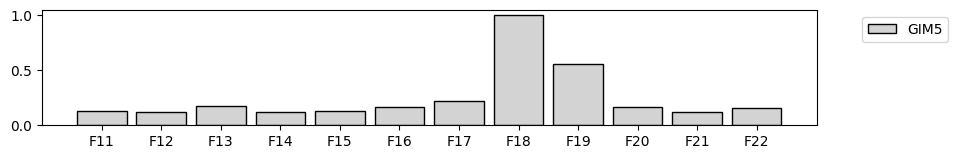

In [100]:
plot_bar(data.loc[df['Majority protein IDs'].isin(['Tb427_090066200','Tb427_090066100'])], 
         dencols, barcolor = 'lightgrey',edgecolor = 'black',
         bar_closeness = 2,
         figsize= (10,1.5),
         xtick_labels=['F11','F12','F13','F14','F15','F16','F17','F18','F19','F20','F21','F22'],
         label_rotation='horizontal',
         edge_linewidth=1, 
         edge_linetype = 'solid',
         legend_name='GIM5', 
         legend_position='upper right',
         font='DejaVu Sans')
#          save_path = rootdir + r"/Fig1_GIM5.pdf")

### Function for multiple bar-plots in the same pdf export:

In [101]:
import numpy as np
import matplotlib.pyplot as plt

def plot_barpq(data, grouped_cols=None, grouped_type='mean', stat='std', ax=None,
               barcolor='blue', edgecolor='black', edge_linewidth=1, edge_linetype='solid',
               bar_closeness=3, xtick_labels=None, label_rotation='horizontal',
               font='Arial', legend_name=None, legend_position='upper right'):
    
    if grouped_cols is not None:
        if len(set([len(lst) for lst in grouped_cols])) != 1:
            raise ValueError("All lists in 'grouped_cols' must have the same number of elements.")
        
        means = []
        errors = []
        
        for i in range(len(grouped_cols[0])):
            values = [pd.to_numeric(data[lst[i]], errors='coerce') for lst in grouped_cols]
            values = np.array(values)

            # Calculate mean and error while ignoring NaNs
            if grouped_type == 'mean':
                mean = np.nanmean(values)
            elif grouped_type == 'median':
                mean = np.nanmedian(values)
            means.append(mean)

            if stat == 'std':
                error = np.nanstd(values)
            elif stat == 'sem':
                error = np.nanstd(values) / np.sqrt(np.count_nonzero(~np.isnan(values)))
            errors.append(error)

        bar_positions = np.arange(len(means))
    else:
        raise ValueError("Both 'cols' and 'grouped_cols' cannot be None.")

    # Use ax to plot instead of plt.bar
    ax.bar(bar_positions, means, width=1 / (bar_closeness + 1), color=barcolor,
           edgecolor=edgecolor, linewidth=edge_linewidth, linestyle=edge_linetype,
           yerr=errors, capsize=5)

    ax.set_xticks(bar_positions)
    ax.set_xticklabels(xtick_labels or [f'Group {i+1}' for i in range(len(means))], rotation=label_rotation, fontname=font)
    ax.set_ylabel('Value')
    ax.set_title(legend_name)


### Bar plots 1D:

In [104]:
merge2.filter(regex='log10_iBAQ').columns

Index(['log10_iBAQ Rep1_Total_Glycosome', 'log10_iBAQ Rep1_SN0',
       'log10_iBAQ Rep1_SN1', 'log10_iBAQ Rep1_SN2', 'log10_iBAQ Rep1_MP',
       'log10_iBAQ Rep2_Total_Glycosome', 'log10_iBAQ Rep2_SN0',
       'log10_iBAQ Rep2_SN1', 'log10_iBAQ Rep2_SN2', 'log10_iBAQ Rep2_MP',
       'log10_iBAQ Rep3_Total_Glycosome', 'log10_iBAQ Rep3_SN0',
       'log10_iBAQ Rep3_SN1', 'log10_iBAQ Rep3_SN2', 'log10_iBAQ Rep3_MP',
       'log10_iBAQ Rep1_Density_F11', 'log10_iBAQ Rep1_Density_F12',
       'log10_iBAQ Rep1_Density_F13', 'log10_iBAQ Rep1_Density_F14',
       'log10_iBAQ Rep1_Density_F15', 'log10_iBAQ Rep1_Density_F16',
       'log10_iBAQ Rep1_Density_F17', 'log10_iBAQ Rep1_Density_F18',
       'log10_iBAQ Rep1_Density_F19', 'log10_iBAQ Rep1_Density_F20',
       'log10_iBAQ Rep1_Density_F21', 'log10_iBAQ Rep1_Density_F22'],
      dtype='object')

In [105]:
glyco1 = ['log10_iBAQ Rep1_Total_Glycosome', 'log10_iBAQ Rep1_SN0',
       'log10_iBAQ Rep1_SN1', 'log10_iBAQ Rep1_SN2', 'log10_iBAQ Rep1_MP']
glyco2 = ['log10_iBAQ Rep2_Total_Glycosome', 'log10_iBAQ Rep2_SN0',
       'log10_iBAQ Rep2_SN1', 'log10_iBAQ Rep2_SN2', 'log10_iBAQ Rep2_MP']
glyco3 = ['log10_iBAQ Rep3_Total_Glycosome', 'log10_iBAQ Rep3_SN0',
       'log10_iBAQ Rep3_SN1', 'log10_iBAQ Rep3_SN2', 'log10_iBAQ Rep3_MP']

glyco = [glyco1, glyco2, glyco3]

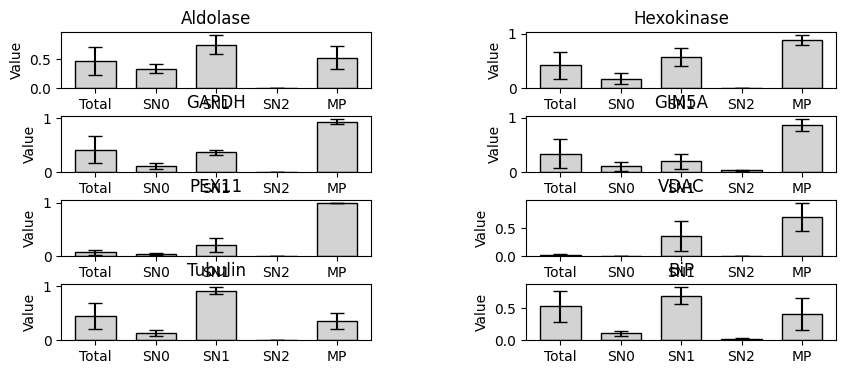

In [107]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Assuming these are your lists
majority_protein_ids = [
    'Tb427_100060400;Tb427_100060200', 
    'Tb427_100023600', 
    'Tb427_060048100;Tb427_060047900;Tb427_060047700',
    'Tb427_090066100', 
    'Tb427_110131800', 
    'Tb427_020010800;Tb427_020010700;Tb427_020010600',
    'Tb427_010018400;Tb427_010018200;Tb427_010018000;Tb427_010017800;Tb427_010017600;Tb427_010017400;Tb427_010017200',
    'Tb427_110081800;Tb427_110081200'
]  # Add more IDs as needed

legend_names = [
    'Aldolase', 
    'Hexokinase', 
    'GAPDH', 
    'GIM5A', 
    'PEX11', 
    'VDAC', 
    'Tubulin', 
    'BiP'
]  # Corresponding legend names

# Create a PdfPages object to save multiple plots in a single PDF
pdf_filename = rootdir + r"/barplots_1D.pdf"
pdf_pages = PdfPages(pdf_filename)

# Create a figure with 4 rows and 2 columns of subplots
fig, axs = plt.subplots(nrows=4, ncols=2, figsize=(10, 4))
axs = axs.flatten()  # Flatten the axes array for easier iteration

# Plot each subplot
for ax, protein_id, legend_name in zip(axs, majority_protein_ids, legend_names):
    # Call your plotting function with the current axis
    plot_barpq(
        merge2[merge2['Majority protein IDs'] == protein_id],
        grouped_cols=glyco,
        grouped_type='mean',
        stat='sem',
        ax=ax,
        bar_closeness=.5,
        barcolor='lightgrey',
        edgecolor='black',
        edge_linewidth=1,
        edge_linetype='solid',
        legend_name=legend_name,
        font='DejaVu Sans',
        xtick_labels=['Total', 'SN0', 'SN1', 'SN2', 'MP']
    )
    
    # Set title for the current plot
    ax.set_title(legend_name)

# Adjust the spacing between subplots
plt.subplots_adjust(hspace=0.5, wspace=0.5)

# Save the figure to the PDF
pdf_pages.savefig(fig)

# Close the PdfPages object
pdf_pages.close()

## Protein gradient profiles:

In [108]:
data.columns

Index(['Protein group ID', 'Protein IDs (Tb427)',
       'Majority protein IDs (Tb427)', 'Protein IDs (Both 427 and 927)',
       'Majority protein IDs (Both 427 and 927)', 'Protein description',
       'Guther et al. Name', 'Guther et al. Description',
       'Mito. OM acc. to Niemann et al. (2013)',
       'Mito. IM acc. to Niemann et al. (2013)',
       'Glycosomal acc. to Güther et al. (2014)', 'Comments',
       'Is a dual localized protein', 'TMD/hydrophobic protein', 'TM Presence',
       'Guther et al High + TM', 'Peroxins and known PMPs', 'Marker - NEW',
       'Marker protein name', 'Mol. weight [kDa]', 'Q-value', 'Score',
       'Mean correlation', 'p-value', 'Class 1/2 PMP final assessment',
       'Class 1/2 protein (preliminary)', 'Glycosomes (Total)', 'SN0', 'SN1',
       'SN2', 'Glycosomal membrane (MP)', 'Correlation Glyco-mem Rep1',
       'Correlation Glyco-mem Rep2', 'Correlation Glyco-mem Rep3',
       'Correlation Glyco-mem imputed Rep1',
       'Correlation Glyco

In [123]:
intCol1 = ['F11','F12', 'F13','F14','F15','F16', 'F17','F18','F19', 'F20','F21','F22']

In [122]:
poi = data[data['Class 1/2 protein (preliminary)']>0]['Majority protein IDs (Tb427)'].to_list()

In [131]:
data[(data['Marker - NEW'] == 'ER') | (data['Marker - NEW'] == 'Mitochondria')]

,Protein group ID,Protein IDs (Tb427),Majority protein IDs (Tb427),Protein IDs (Both 427 and 927),Majority protein IDs (Both 427 and 927),Protein description,Guther et al. Name,Guther et al. Description,Mito. OM acc. to Niemann et al. (2013),Mito. IM acc. to Niemann et al. (2013),...,F13,F14,F15,F16,F17,F18,F19,F20,F21,F22
111,3036,Tb427_100050200,Tb427_100050200,Tb427_100050200;Tb927.10.4610,Tb427_100050200;Tb927.10.4610,Glycosyltransferase like family 2/Glycosyl tra...,NaN,"dolicholphosphate-mannose synthase, putative",NaN,NaN,...,0.010000,0.000000,0.002000,0.000000,0.030000,1.000000,0.187000,0.000000,0.000000e+00,0.000000
112,430,Tb427_020010800;Tb427_020010700;Tb427_020010600,Tb427_020010800;Tb427_020010700;Tb427_020010600,Tb427_020010600;Tb427_020010700;Tb427_02001080...,Tb427_020010600;Tb427_020010700;Tb427_02001080...,"hypothetical protein, conserved ;hypothetical ...",NaN,voltage-dependent anion-selective channel,Yes,NaN,...,0.022088,0.000027,0.009797,0.000108,0.131202,1.000000,0.135161,0.000374,4.411930e-05,0.000021
122,2585,Tb427_090050100,Tb427_090050100,Tb427_090050100;Tb927.9.8950,Tb427_090050100;Tb927.9.8950,"CAAX prenyl protease N-terminal, five membrane...",NaN,NaN,NaN,NaN,...,0.005821,0.000019,0.001686,0.000016,0.142688,1.000000,0.089933,0.000016,4.544940e-06,0.000012
152,2029,Tb427_080021700,Tb427_080021700,Tb427_080021700;Tb927.8.1890,Tb427_080021700;Tb927.8.1890,"Cytochrome C1 family, putative",NaN,"cytochrome c1, heme protein, mitochondrial pre...",NaN,Yes,...,0.001063,0.000026,0.001618,0.000046,0.108931,1.000000,0.036201,0.000091,1.581570e-05,0.000010
192,1235,Tb427_050040500,Tb427_050040500,Tb427_050040500;Tb927.5.3400,Tb427_050040500;Tb927.5.3400,"Cation transporter/ATPase, N-terminus/E1-E2 AT...",NaN,"calcium-translocating P-type ATPase,calcium pump",NaN,NaN,...,0.009886,0.000122,0.001430,0.000109,0.076586,1.000000,0.201018,0.000043,4.819680e-05,0.000096
202,3682,Tb427_110009600,Tb427_110009600,Tb427_110009600;Tb927.11.540.1-p1;Tb927.11.540...,Tb427_110009600;Tb927.11.540.1-p1;Tb927.11.540...,ABC transporter transmembrane region/ABC trans...,NaN,"ABC transporter, putative",NaN,NaN,...,0.005362,0.000022,0.003081,0.000019,0.041764,1.000000,0.097874,0.000999,1.470050e-04,0.000052
229,1098,Tb427_050013700,Tb427_050013700,Tb11.v5.0559.1-p1;Tb427_050013700;Tb427_050013...,Tb11.v5.0559.1-p1;Tb427_050013700;Tb427_050013...,"Oligosaccharyl transferase STT3 subunit, putat...",NaN,"oligosaccharyl transferase subunit, putative",NaN,NaN,...,0.003131,0.000424,0.002357,0.000154,0.041214,1.000000,0.060135,0.000386,2.085580e-04,0.000312
242,819,Tb427_040007800,Tb427_040007800,Tb427_040007800;Tb927.4.590,Tb427_040007800;Tb927.4.590,"ER membrane protein complex subunit 1, C-termi...",NaN,"hypothetical protein, conserved",NaN,NaN,...,0.003448,0.000194,0.000091,0.000072,0.084095,1.000000,0.105752,0.000161,7.753220e-05,0.000041
397,1944,Tb427_080005700,Tb427_080005700,Tb427_080005700;Tb927.8.560,Tb427_080005700;Tb927.8.560,"hypothetical protein, conserved",NaN,"hypothetical protein, conserved",Yes,NaN,...,0.001049,0.001047,0.001488,0.000348,0.044518,1.000000,0.060283,0.000219,1.685960e-04,0.000235
817,4077,Tb427_110081800;Tb427_110081200,Tb427_110081800;Tb427_110081200,Tb427_110081200;Tb427_110081800;Tb927.11.7460;...,Tb427_110081200;Tb427_110081800;Tb927.11.7460;...,Hsp70 protein/MreB/Mbl protein/FGGY family of ...,NaN,"glucose-regulated protein 78, putative,luminal...",NaN,NaN,...,0.006563,0.000015,0.000075,0.000002,0.119650,1.000000,0.062556,0.000204,2.273200e-07,0.000031


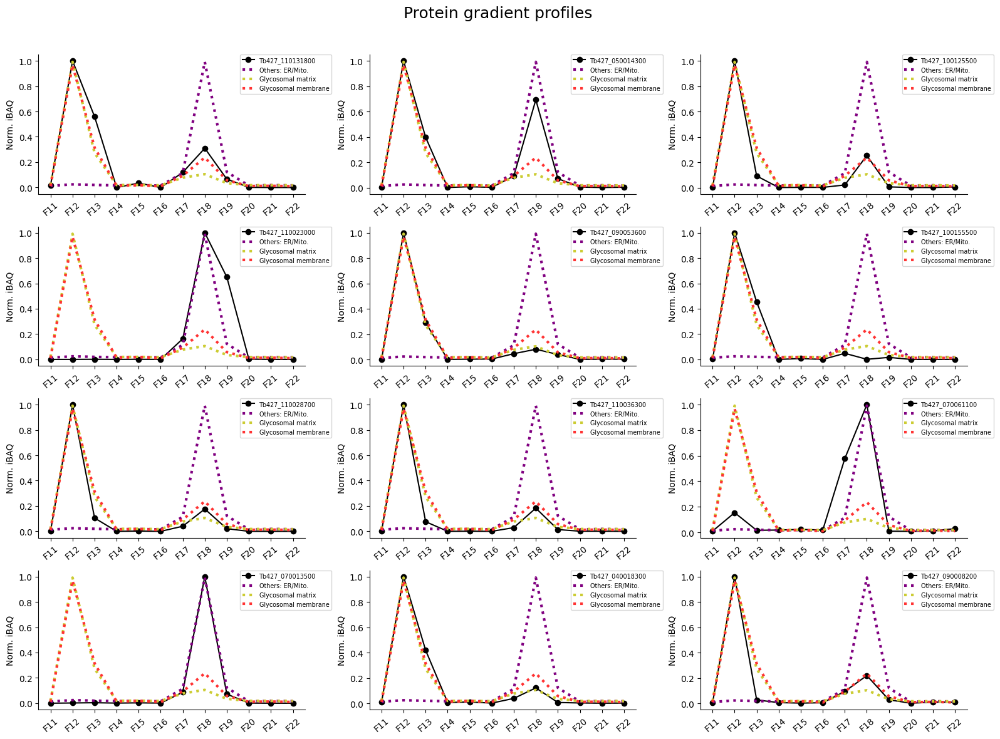

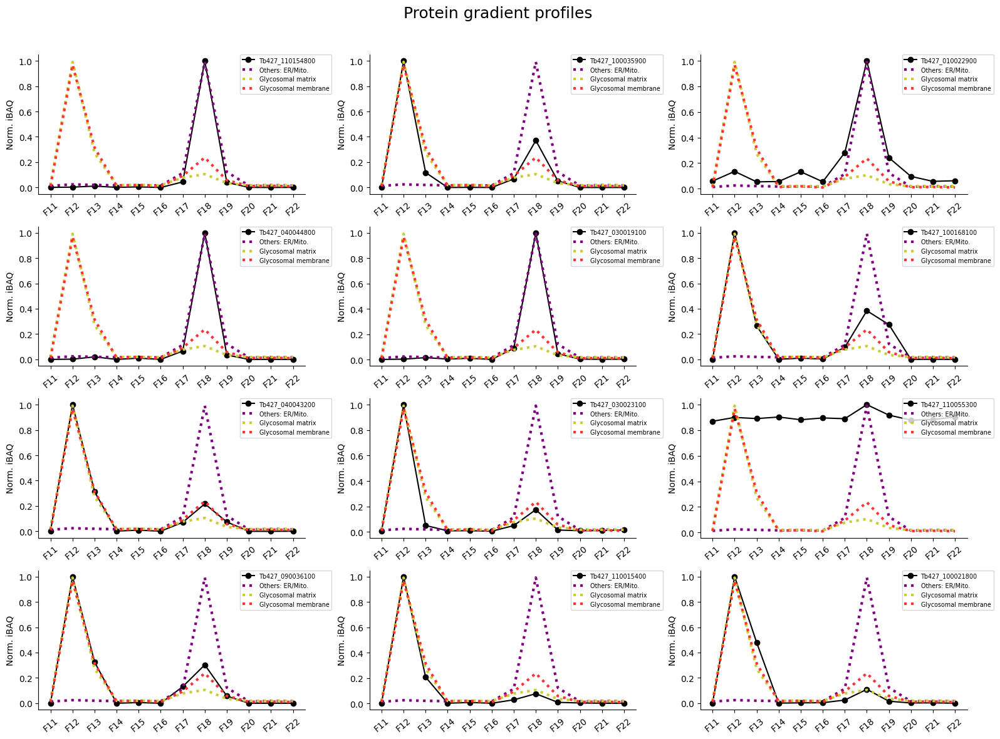

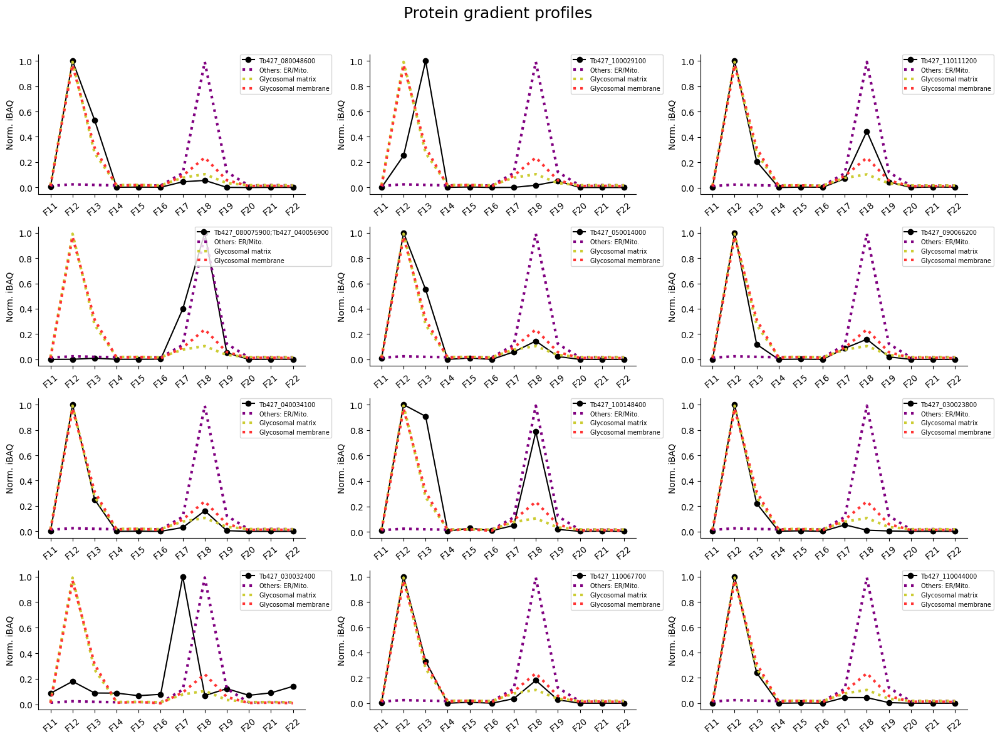

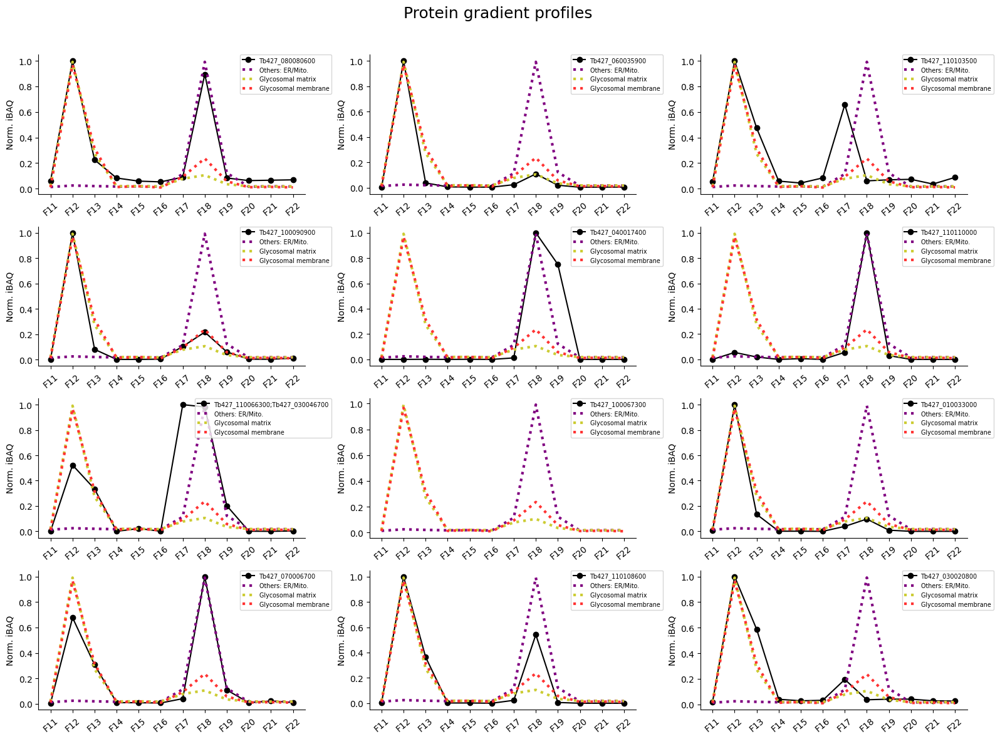

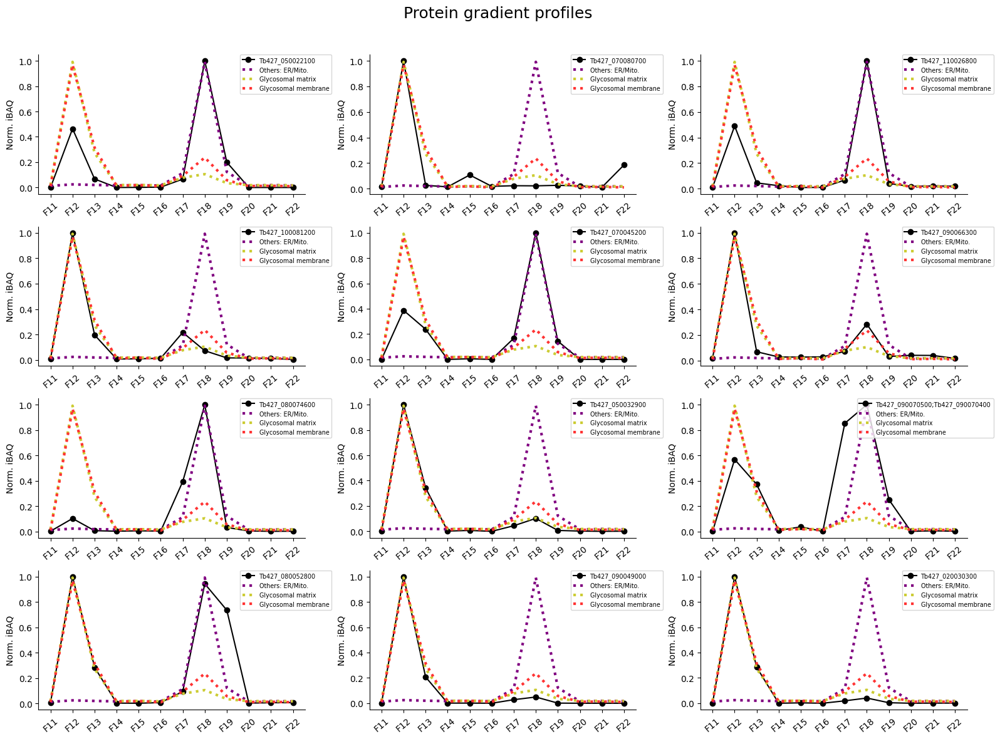

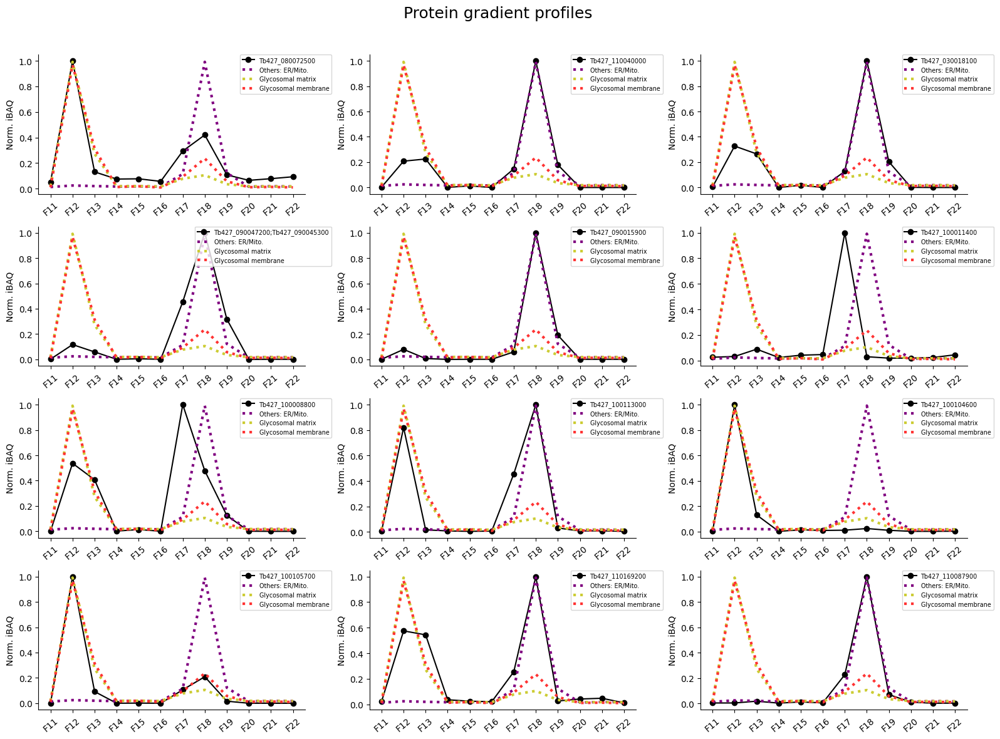

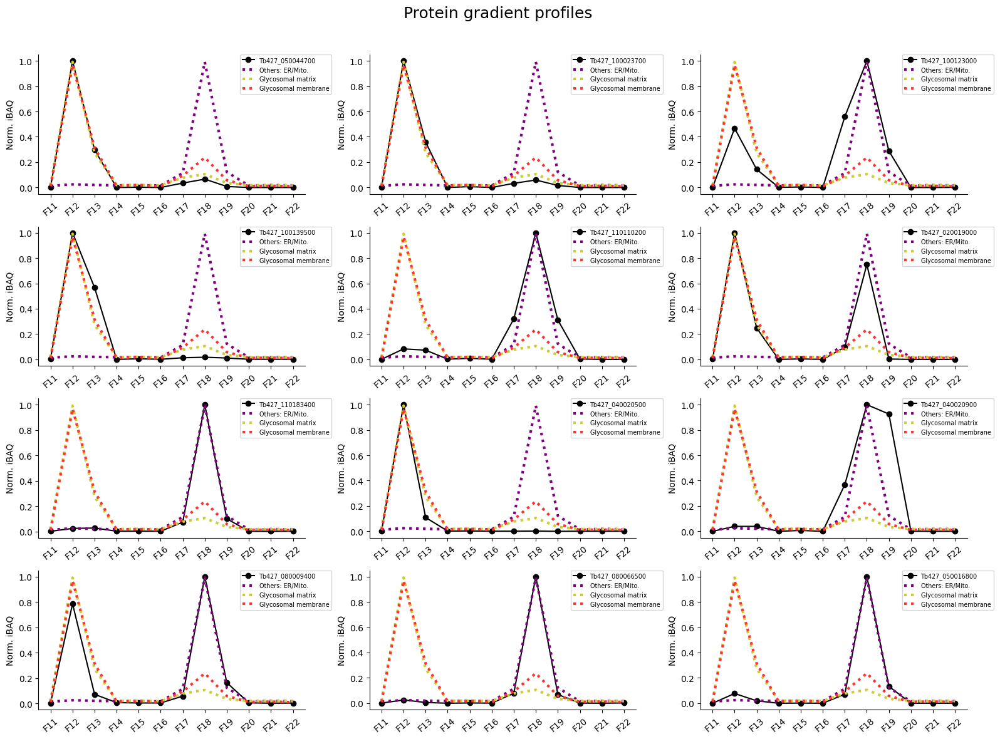

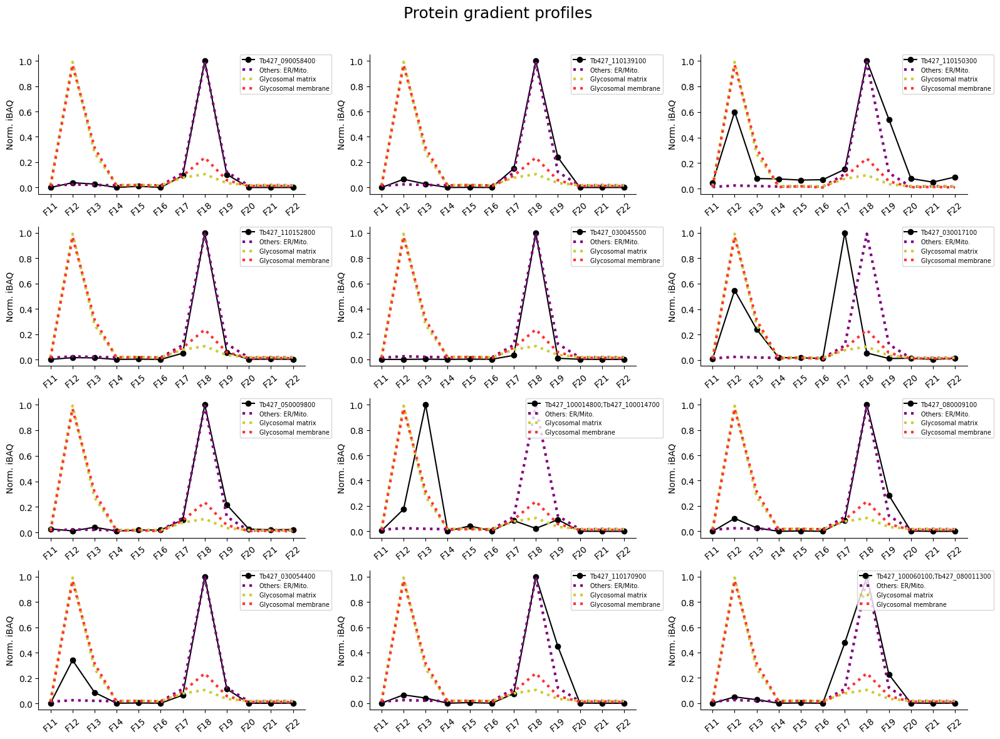

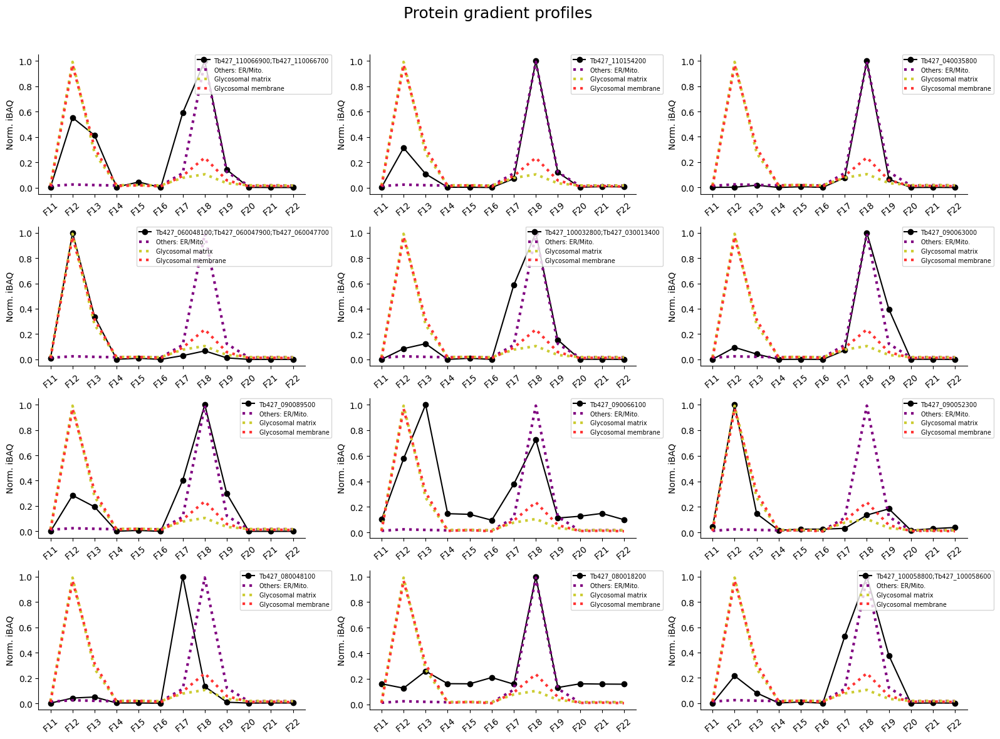

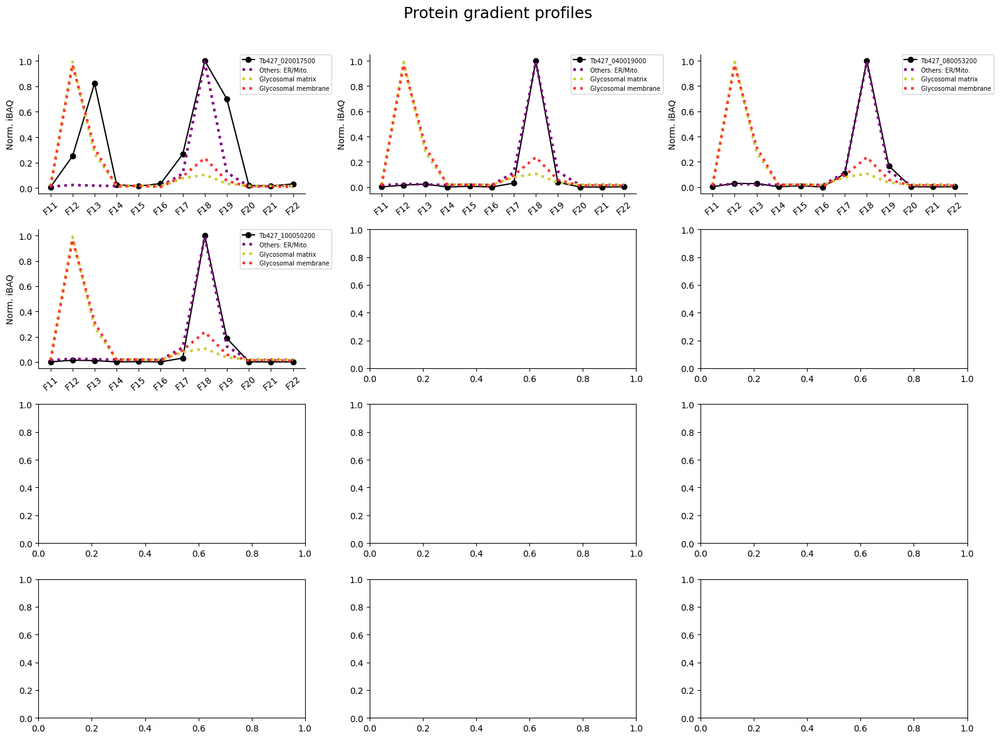

In [135]:
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Create a PDF file to save all plots
with PdfPages("results/density_profiles.pdf") as pdf:
    # Define the number of rows and columns per page
    rows, cols = 4, 3
    plots_per_page = rows * cols

    # Main plotting code
    for i, p in enumerate(poi):
        # Create a new figure for every set of 12 plots
        if i % plots_per_page == 0:
            fig, axes = plt.subplots(rows, cols, figsize=(16, 12))
            fig.suptitle("Protein gradient profiles", size=18)
            # Flatten axes array for easier iteration
            axes = axes.flatten()

        # Get the current axis to plot on
        ax = axes[i % plots_per_page]

        # Plotting traces for a single subplot
        ax.set_title(p, fontsize=14)
        vis.plot_traces(
            data[data['Majority protein IDs (Tb427)'] == p],
            intCol1,
            ax=ax,
            plot_summary_only=False,
            color="black",
            marker='o',
            ylabel='Norm. iBAQ',
            label=p
        )
        ticks = ['F11', 'F12', 'F13', 'F14', 'F15', 'F16', 'F17', 'F18', 'F19', 'F20', 'F21', 'F22']

        vis.plot_traces(data[(data['Marker - NEW'] == 'ER') | (data['Marker - NEW'] == 'Mitochondria')], intCol1, ax=ax, plot_summary_only=True, summary_color="purple", summary_style='dotted', ylabel='Norm. iBAQ', label='Others: ER/Mito.')
        vis.plot_traces(data[data['Marker - NEW'] == 'Glycosomal matrix'], intCol1, ax=ax, plot_summary_only=True, summary_color="#CCCC33", summary_style='dotted', ylabel='Norm. iBAQ', label='Glycosomal matrix')
        vis.plot_traces(data[data['Marker - NEW'] == 'Glycosomal membrane'], intCol1, ax=ax, plot_summary_only=True, summary_color="#FF3333", summary_style='dotted', ylabel='Norm. iBAQ', label='Glycosomal membrane')

        ax.set_xticks(range(len(ticks)))
        ax.set_xticklabels(ticks, rotation=40, ha='center')
        
        # Add legend
        ax.legend(loc='upper right', fontsize='x-small', bbox_to_anchor=(1.1, 1), borderaxespad=0.)

        # Adjust layout if it's the last plot on the page or the last plot overall
        if (i + 1) % plots_per_page == 0 or (i + 1) == len(poi):
            plt.tight_layout(rect=[0, 0, 1, 0.96])
            # Save the current figure to the PDF
            pdf.savefig(fig, bbox_inches='tight')
            # Close the figure to free up memory
            # plt.close(fig)

## Rank-product volcano plots:


### Supplementary figure 2:

In [193]:
data.columns

Index(['Protein group ID', 'ID'ed in Moloney et al.',
       'tagm.map.localisation.prediction', 'Protein IDs (Tb427)',
       'Majority protein IDs (Tb427)', 'Protein IDs (Both 427 and 927)',
       'Majority protein IDs (Both 427 and 927)', 'Protein description',
       'Guther et al. Name', 'Guther et al. Description',
       'Mito. OM acc. to Niemann et al. (2013)',
       'Mito. IM acc. to Niemann et al. (2013)',
       'Glycosomal acc. to Güther et al. (2014)', 'Comments',
       'Is a dual localized protein', 'TMD/hydrophobic protein', 'TM Presence',
       'Guther et al High + TM', 'Peroxins and known PMPs', 'Marker - NEW',
       'Marker protein name', 'Mol. weight [kDa]', 'Q-value', 'Score',
       'Mean correlation', 'p-value', 'Class 1/2 PMP final assessment',
       'Class 1/2 protein (preliminary)', 'Glycosomes (Total)', 'SN0', 'SN1',
       'SN2', 'Glycosomal membrane (MP)', 'Correlation Glyco-mem Rep1',
       'Correlation Glyco-mem Rep2', 'Correlation Glyco-mem Rep3',


In [194]:
data['Glycosomal acc. to Güther et al. (2014)'].value_counts()

Glycosomal acc. to Güther et al. (2014)
High-confidence        87
Possible glycosomal    52
Name: count, dtype: int64

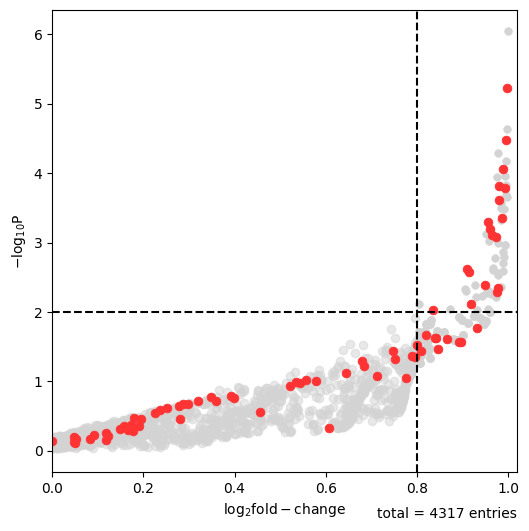

In [197]:
default_highlight_kwargs = {
    "marker": "o",  # set highlight shape to circle
    "s": 30,  # set highlight size to 100
    "alpha": 1,  # set highlight alpha to 0.8
}

fig = vis.volcano(data,log_fc_colname="Mean correlation", 
            p_colname='p-value',
            p_thresh=0.01,log_fc_thresh = 0.8,
            annotate_colname = "Majority protein IDs (Tb427)",
            figsize= (6, 6),
            show_legend=False,
            annotate_density=1,
   highlight=[
        data[data['Glycosomal acc. to Güther et al. (2014)']=='High-confidence'].index,
   ]
        ,
    annotate="highlight",
    kwargs_highlight=[
        default_highlight_kwargs
        | {
            "color": "#FF3333",  # set highlight color to red
            "label": "Glycosomal membrane",  # set highlight label
             "s": 40,
            "linewidths": 0.5,
        }
    ],
    kwargs_both_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        #      'edgecolors': '#58b3e8',    # set highlight edge colors to black
        "linewidths": 0.5,  # set highlight linewidths to 0.5
        "label": None,  # set highlight label
    },
    kwargs_log_fc_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        "label": None,  # set highlight label
    },
    kwargs_p_sig={
        "color": "lightgrey",  # set highlight color to red
        "marker": "o",  # set highlight shape to circle
        "s": 30,  # set highlight size to 100
        "alpha": 1,  # set highlight alpha to 0.8
        # set highlight edge colors to black
        "linewidths": 0.5,  # set highlight linewidths to 0.5
        "label": None,  # set highlight label
    }    
    )
plt.xlim(0,1.02)
# plt.ylim(-0.5,7.02)
# plt.savefig(rootdir + '/VolcanoPlot_Guther_High-confidence.pdf')

# Dataset- Separation of identifiers:

Function to separate the IDs:

In [173]:
import pandas as pd

def separate_protein_ids(df, sep=";", cols_to_separate=None, col_names=None, prefix="Tb927"):
    """
    Separates entries in specified columns of a DataFrame based on prefix.

    Parameters:
    - df: pd.DataFrame. The input dataframe.
    - sep: str, optional. The separator used to separate entries in cells. Default is ";".
    - cols_to_separate: list, optional. Columns to apply separation on.
    - col_names: list, optional. New column names for the extracted data.
    - prefix: str, optional. Prefix to match at the start of each entry. Default is "Tb927".

    Returns:
    - pd.DataFrame. Updated DataFrame with new columns containing filtered entries.
    """
    if cols_to_separate is None or col_names is None or len(cols_to_separate) != len(col_names):
        raise ValueError("Please provide matching 'cols_to_separate' and 'col_names' lists.")

    # Loop through each column to be separated
    for col, new_col in zip(cols_to_separate, col_names):
        
        def filter_entries(entry):
            """
            Filters entries in a cell based on the prefix.
            """
            # Split the entry into parts using the separator
            parts = entry.split(sep)
            # Keep only the parts that start with the desired prefix
            filtered_parts = [part for part in parts if part.strip().startswith(prefix)]
            
            # Debug print: see the intermediate values for each row
            # print(f"Original entry: {entry}")
            # print(f"Filtered parts: {filtered_parts}")
            
            # Join the filtered entries back into a single string using the separator
            return sep.join(filtered_parts)

        # Apply the filtering function to the specified column
        df[new_col] = df[col].apply(lambda x: filter_entries(x) if pd.notnull(x) else x)
    
    return df


In [174]:
data2 = separate_protein_ids(
    df=data,
    sep=';',
    cols_to_separate=['Protein IDs (Both 427 and 927)'],
    col_names=['Protein IDs (927)'],
    prefix="Tb927"
)

In [176]:
data2 = separate_protein_ids(
    df=data,
    sep=';',
    cols_to_separate=['Majority protein IDs (Both 427 and 927)'],
    col_names=['Majority protein IDs (927)'],
    prefix="Tb927"
)

In [178]:
data2.to_excel("results/Results_Tb_Protein_Ids_separated.xlsx", index=False)